SECTION 1 

BASIC FUNCTIONS

In [1]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

print("OpenCV:", cv.__version__)
print("NumPy:", np.__version__)

OpenCV: 5.0.0
NumPy: 2.5.2


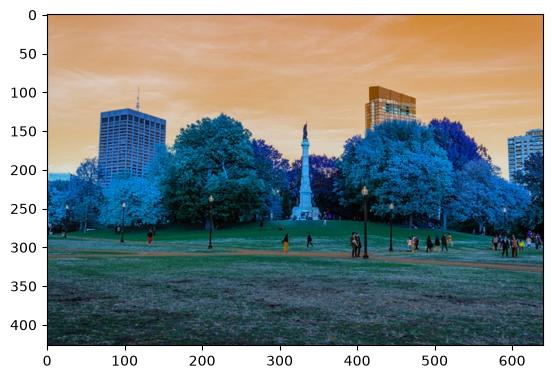

In [2]:
# Read in an image
img = cv.imread('Resources/Photos/park.jpg')
cv.imshow('Park', img)
plt.imshow(img)

`cv.imread()` зчитує зображення з файла та повертає його як масив нампай. для кольорового зображення OpenCV використовує порядок каналів BGR; альтернативи — Pillow та scikit-image.

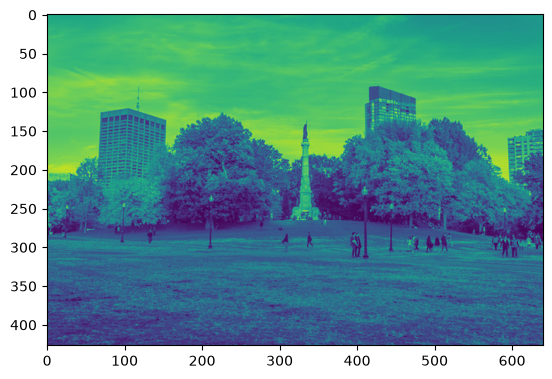

In [3]:
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
cv.imshow('Gray', gray)
plt.imshow(gray)

`cv.cvtColor(..., cv.COLOR_BGR2GRAY)` перетворює три канали BGR в один канал яскравості. grayscale зменшує обсяг даних і часто використовується перед пошуком контурів, пороговою обробкою та іншими алгоритмами.

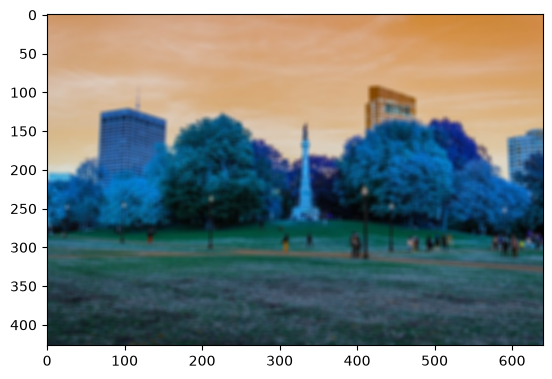

In [4]:
blur = cv.GaussianBlur(img, (7,7), cv.BORDER_DEFAULT)
cv.imshow('Blur', blur)
plt.imshow(blur)

`cv.GaussianBlur()` згладжує зображення за допомогою гаусового ядра. збільшення kernel size посилює розмиття і пригнічує шум, але може прибирати дрібні деталі.

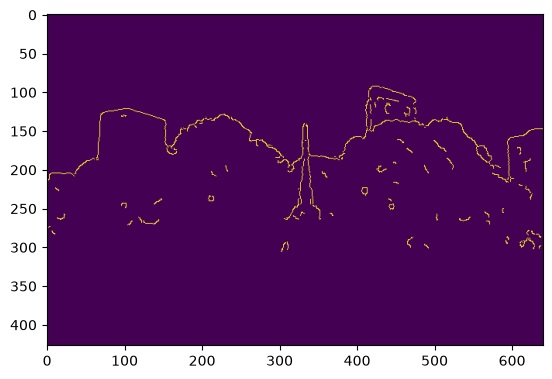

In [5]:
canny = cv.Canny(blur, 125, 175)
cv.imshow('Canny Edges', canny)
plt.imshow(canny)

`cv.Canny()` знаходить границі за змінами інтенсивності. два пороги задають чутливість алгоритму: менші значення дають більше контурів і шуму, більші залишають лише сильніші границі.

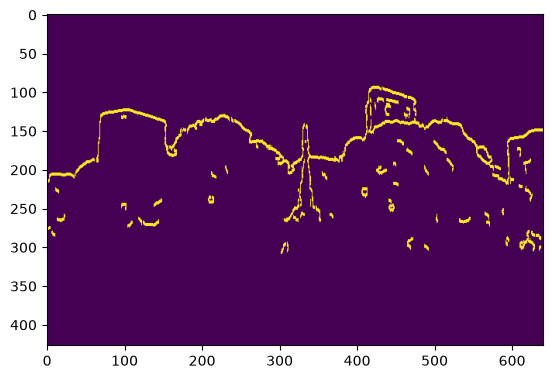

In [6]:
dilated = cv.dilate(canny, (7,7), iterations=3)
cv.imshow('Dilated', dilated)
plt.imshow(dilated)

`cv.dilate()` розширює світлі області бінарного зображення, тому контури стають товстішими. параметр `iterations` визначає, скільки разів повторюється операція.

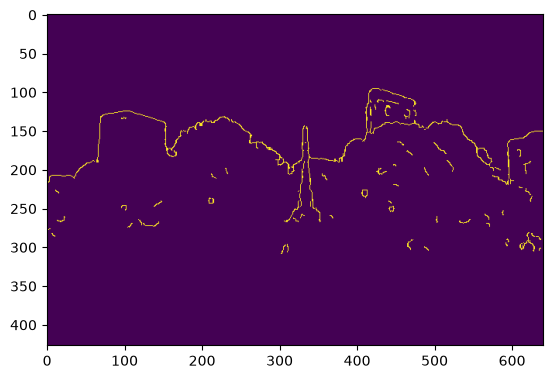

In [7]:
eroded = cv.erode(dilated, (7,7), iterations=3)
cv.imshow('Eroded', eroded)
plt.imshow(eroded)

`cv.erode()` звужує світлі області та може прибирати дрібні білі шуми. зі збільшенням `iterations` ерозія стає сильнішою.

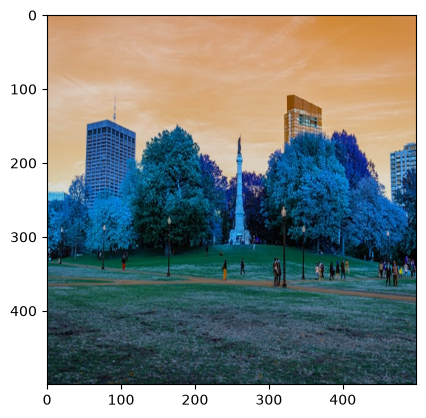

In [8]:
resized = cv.resize(img, (500,500), interpolation=cv.INTER_CUBIC)
cv.imshow('Resized', resized)
plt.imshow(resized)

`cv.resize()` змінює просторовий розмір зображення. `INTER_CUBIC` дає плавний результат при збільшенні, а для зменшення зазвичай краще підходить `INTER_AREA`.

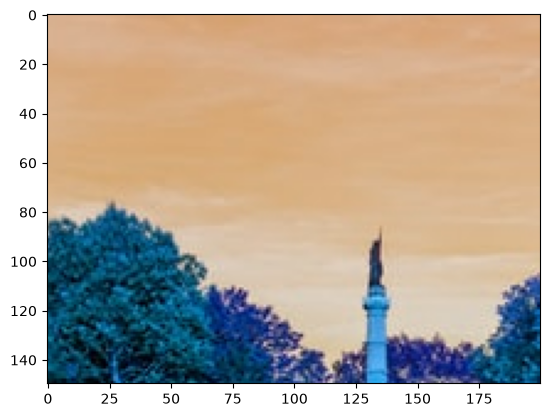

In [9]:
cropped = img[50:200, 200:400]
cv.imshow('Cropped', cropped)
plt.imshow(cropped)

обрізання виконується звичайним numpy-зрізом `img[y1:y2, x1:x2]`. межі зрізу визначають положення та розмір вибраної області зображення.

COUNTURS

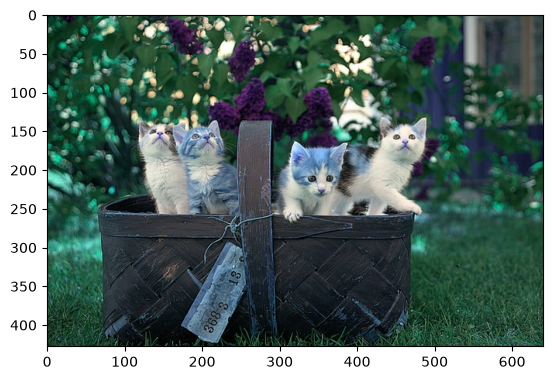

In [10]:
img = cv.imread('Resources/Photos/cats.jpg')
cv.imshow('Cats', img)
plt.imshow(img)

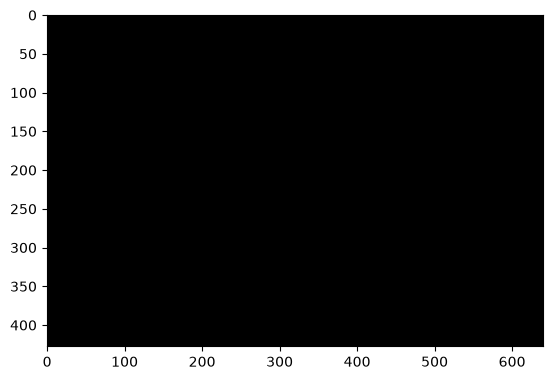

In [11]:
blank = np.zeros(img.shape, dtype='uint8')
cv.imshow('Blank', blank)
plt.imshow(blank)

`np.zeros()` створює чорне зображення, заповнене нульовими значеннями. `dtype='uint8'` відповідає типовому для OpenCV діапазону інтенсивності 0–255.

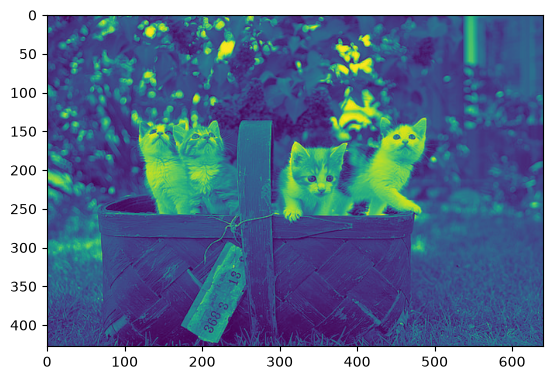

In [12]:
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
cv.imshow('Gray', gray)
plt.imshow(gray)

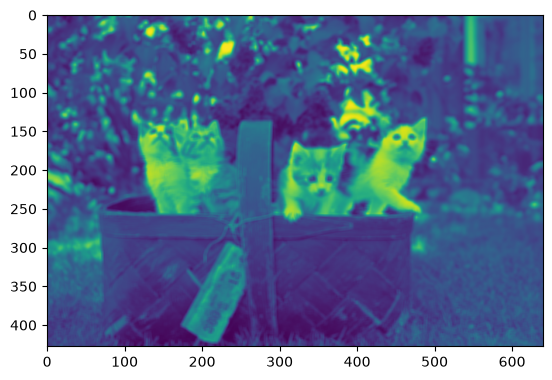

In [13]:
blur = cv.GaussianBlur(gray, (5,5), cv.BORDER_DEFAULT)
cv.imshow('Blur', blur)
plt.imshow(blur)

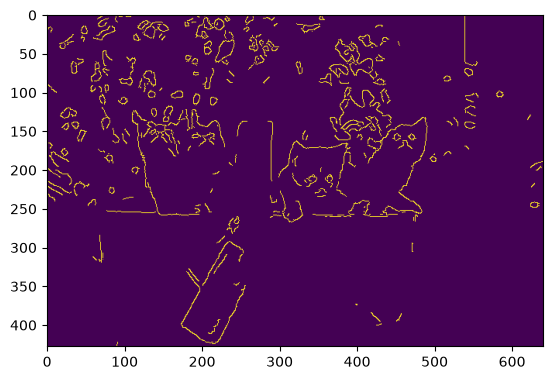

In [14]:
canny = cv.Canny(blur, 125, 175)
cv.imshow('Canny Edges', canny)
plt.imshow(canny)

In [15]:
contours, hierarchies = cv.findContours(canny, cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)
print(f'{len(contours)} contour(s) found!')

380 contour(s) found!


`cv.findContours()` знаходить контури на бінарному зображенні. `RETR_LIST` повертає всі контури, а `CHAIN_APPROX_SIMPLE` стискає послідовності точок і зберігає лише ключові координати.

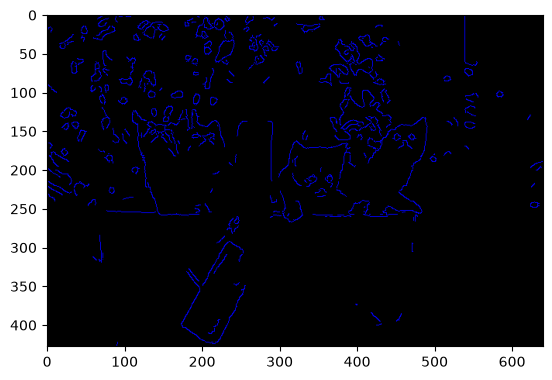

In [16]:
cv.drawContours(blank, contours, -1, (0,0,255), 1)
cv.imshow('Contours Drawn', blank)
plt.imshow(blank)

`cv.drawContours()` наносить знайдені контури на зображення. значення `-1` означає намалювати всі контури, останній параметр задає товщину лінії.

DRAW

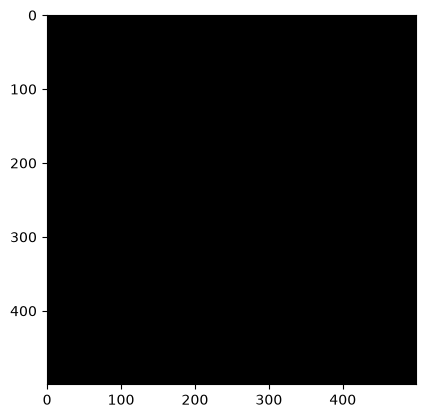

In [17]:
blank = np.zeros((500,500,3), dtype='uint8')
plt.imshow(blank)

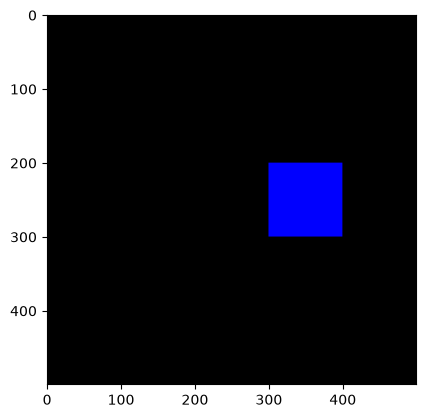

In [18]:
blank[200:300, 300:400] = 0,0,255
cv.imshow('Green', blank)
plt.imshow(blank)

пряме присвоєння значень ділянці масиву змінює колір вибраних пікселів. у OpenCV `(0, 0, 255)` відповідає червоному кольору через порядок каналів BGR.

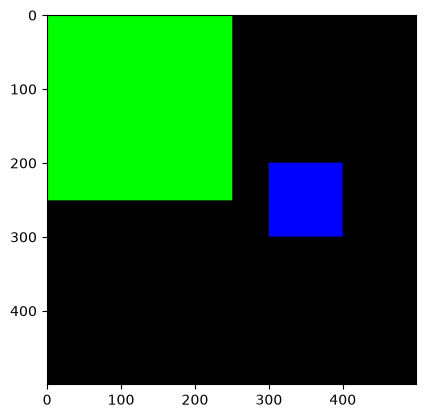

In [19]:
cv.rectangle(blank, (0,0), (blank.shape[1]//2, blank.shape[0]//2), (0,255,0), thickness=-1)
cv.imshow('Rectangle', blank)
plt.imshow(blank)

`cv.rectangle()` малює прямокутник між двома координатами. `thickness=-1` повністю зафарбовує фігуру, а додатне значення задає товщину рамки.

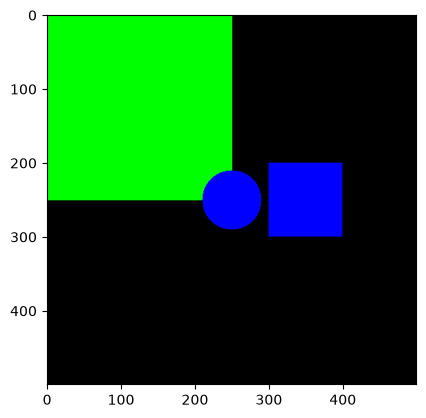

In [20]:
cv.circle(blank, (blank.shape[1]//2, blank.shape[0]//2), 40, (0,0,255), thickness=-1)
cv.imshow('Circle', blank)
plt.imshow(blank)

`cv.circle()` малює коло за координатами центра і радіусом. `thickness=-1` створює заповнене коло.

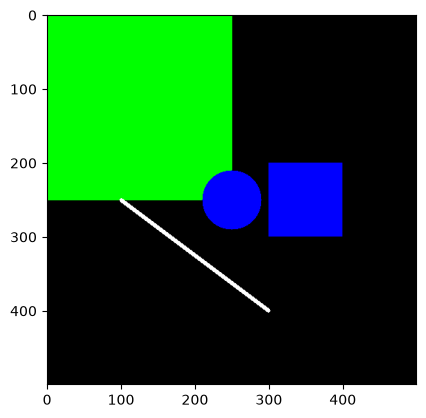

In [21]:
cv.line(blank, (100,250), (300,400), (255,255,255), thickness=3)
cv.imshow('Line', blank)
plt.imshow(blank)

`cv.line()` проводить лінію між двома точками; параметр `thickness` задає її товщину в пікселях.

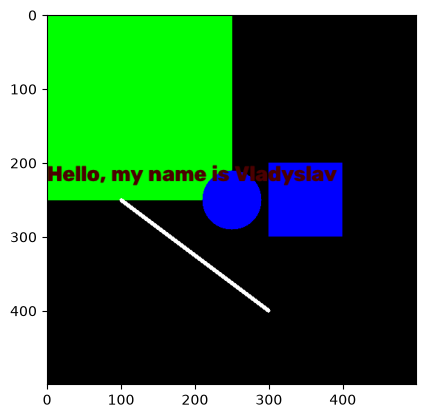

In [22]:
cv.putText(blank, 'Hello, my name is Vladyslav', (0,225), cv.FONT_HERSHEY_TRIPLEX, 1.0, (75,0,0), 2)
cv.imshow('Text', blank)
plt.imshow(blank)

`cv.putText()` додає текст на зображення. координати визначають початок напису, `fontScale` — розмір, а `thickness` — товщину символів.

READ

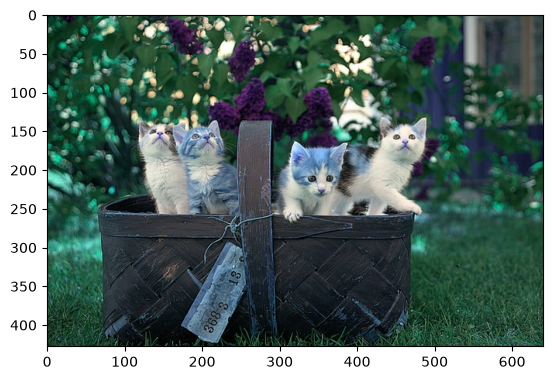

In [23]:
img = cv.imread('Resources/Photos/cats.jpg')
cv.imshow('Cats', img)
plt.imshow(img)

In [24]:
capture = cv.VideoCapture('../Resources/Videos/dog.mp4')

while True:
    isTrue, frame = capture.read()
    
    # if cv.waitKey(20) & 0xFF==ord('d'):
    # This is the preferred way - if `isTrue` is false (the frame could 
    # not be read, or we're at the end of the video), we immediately
    # break from the loop. 
    if isTrue:    
        cv.imshow('Video', frame)
        if cv.waitKey(20) & 0xFF==ord('d'):
            break            
    else:
        break

capture.release()
cv.destroyAllWindows()

`cv.VideoCapture()` відкриває відеофайл, а `capture.read()` послідовно повертає статус читання та черговий кадр. після завершення роботи `release()` звільняє ресурс відео.

THRESH

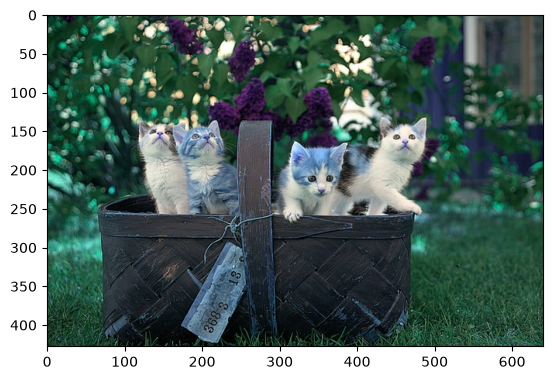

In [25]:
img = cv.imread('Resources/Photos/cats.jpg')
cv.imshow('Cats', img)
plt.imshow(img)

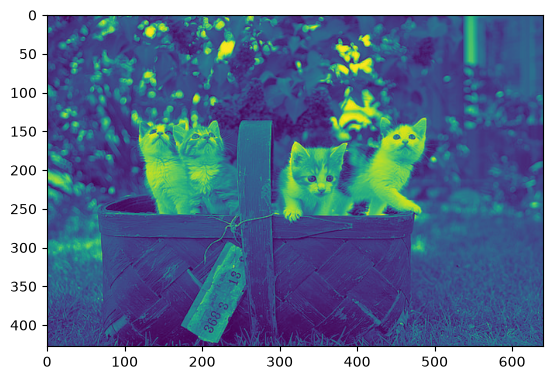

In [26]:
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
cv.imshow('Gray', gray)
plt.imshow(gray)

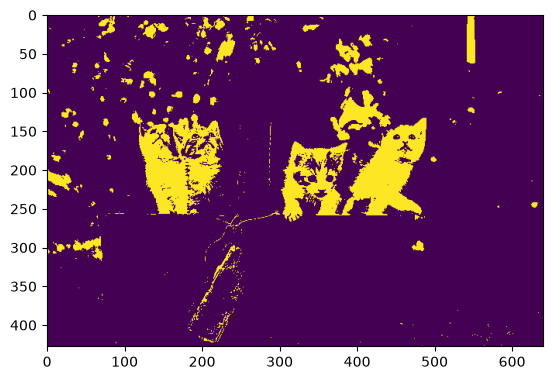

In [27]:
threshold, thresh = cv.threshold(gray, 150, 255, cv.THRESH_BINARY )
cv.imshow('Simple Thresholded', thresh)
plt.imshow(thresh)

`cv.threshold()` виконує глобальну бінаризацію. при `THRESH_BINARY` пікселі вище порога отримують максимальне значення, решта — 0; зміна threshold змінює співвідношення чорних і білих областей.

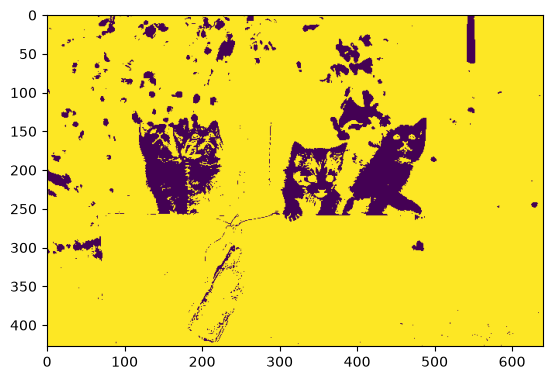

In [28]:
threshold, thresh_inv = cv.threshold(gray, 150, 255, cv.THRESH_BINARY_INV )
cv.imshow('Simple Thresholded Inverse', thresh_inv)
plt.imshow(thresh_inv)

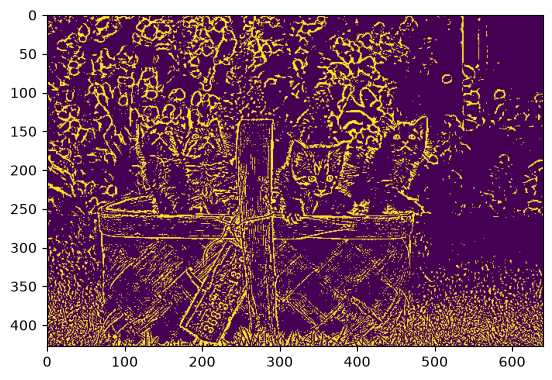

In [29]:
adaptive_thresh = cv.adaptiveThreshold(gray, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY_INV, 11, 9)
cv.imshow('Adaptive Thresholding', adaptive_thresh)
plt.imshow(adaptive_thresh)

`cv.adaptiveThreshold()` обчислює локальний поріг окремо для різних ділянок зображення. block size визначає розмір локальної області, а `C` коригує отриманий поріг.

TRANSFORMATIONS

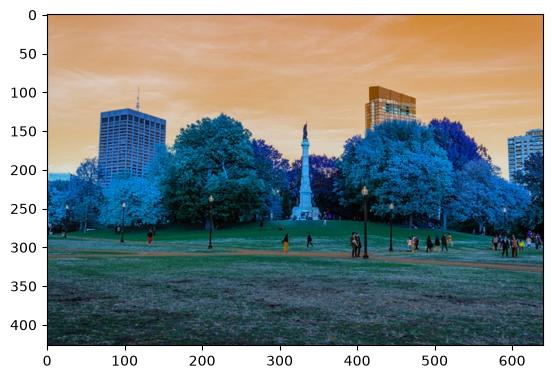

In [30]:
img = cv.imread('Resources/Photos/park.jpg')
cv.imshow('Park', img)
plt.imshow(img)

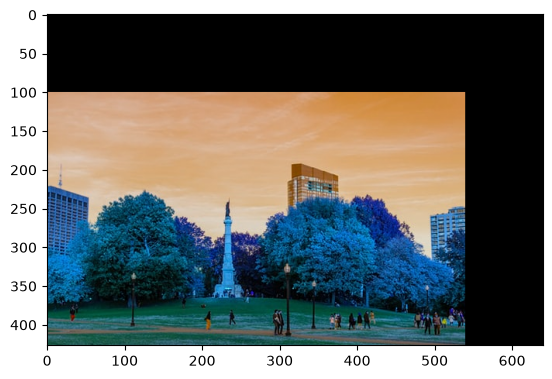

In [31]:
# Translation
def translate(img, x, y):
    transMat = np.float32([[1,0,x],[0,1,y]])
    dimensions = (img.shape[1], img.shape[0])
    return cv.warpAffine(img, transMat, dimensions)

# -x --> Left
# -y --> Up
# x --> Right
# y --> Down

translated = translate(img, -100, 100)
cv.imshow('Translated', translated)
plt.imshow(translated)

`translate()` формує афінну матрицю перенесення та застосовує її через `cv.warpAffine()`. додатні `x` і `y` зміщують зображення праворуч і вниз, від'ємні — у протилежні боки.

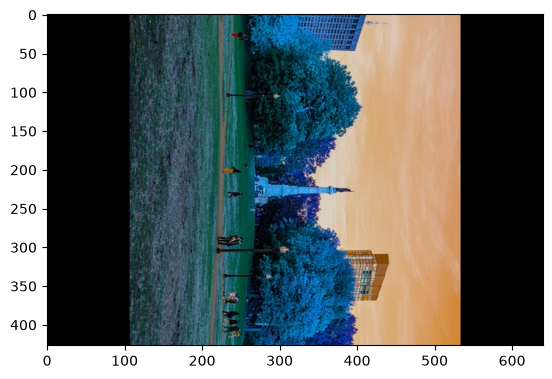

In [32]:
# Rotation
def rotate(img, angle, rotPoint=None):
    (height,width) = img.shape[:2]

    if rotPoint is None:
        rotPoint = (width//2,height//2)
    
    rotMat = cv.getRotationMatrix2D(rotPoint, angle, 1.0)
    dimensions = (width,height)

    return cv.warpAffine(img, rotMat, dimensions)

rotated = rotate(img, -45)
cv.imshow('Rotated', rotated)

rotated_rotated = rotate(img, -90)
cv.imshow('Rotated Rotated', rotated_rotated)
plt.imshow(rotated_rotated)

`rotate()` використовує `cv.getRotationMatrix2D()` для побудови матриці повороту. `angle` задає кут, а `rotPoint` — центр обертання.

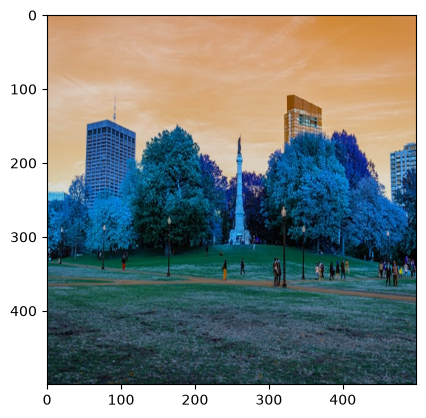

In [33]:
resized = cv.resize(img, (500,500), interpolation=cv.INTER_CUBIC)
cv.imshow('Resized', resized)
plt.imshow(resized)

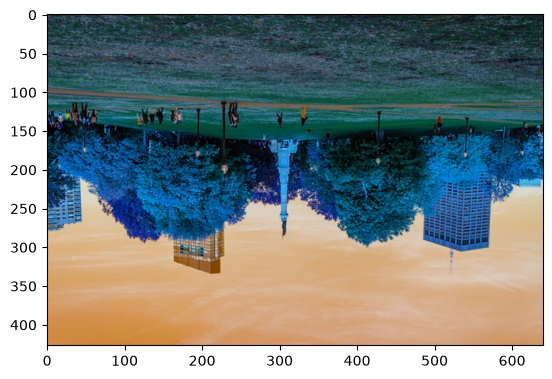

In [34]:
flip = cv.flip(img, -1)
cv.imshow('Flip', flip)
plt.imshow(flip)

`cv.flip()` віддзеркалює зображення. `0` — по вертикалі, `1` — по горизонталі, `-1` — одночасно по обох осях.

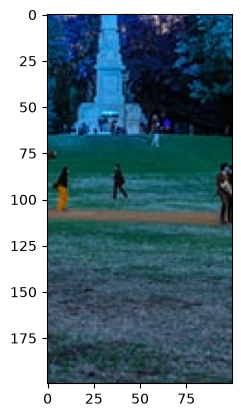

In [35]:
cropped = img[200:400, 300:400]
cv.imshow('Cropped', cropped)
plt.imshow(cropped)

SECTION 2 - ADVANCED

BITWISE

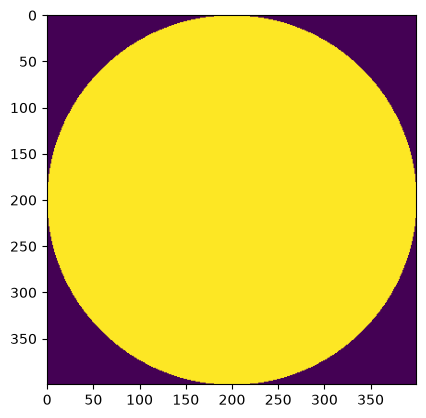

In [36]:
blank = np.zeros((400,400), dtype='uint8')

rectangle = cv.rectangle(blank.copy(), (30,30), (370,370), 255, -1)
circle = cv.circle(blank.copy(), (200,200), 200, 255, -1)

cv.imshow('Rectangle', rectangle)
cv.imshow('Circle', circle)
plt.imshow(circle)

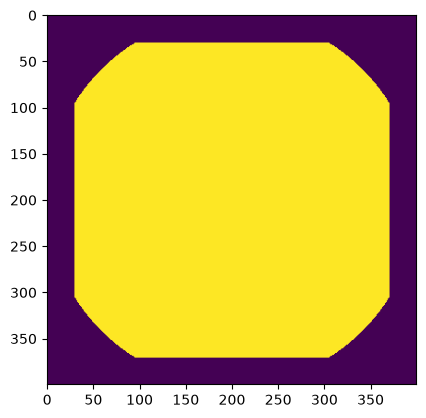

In [37]:
bitwise_and = cv.bitwise_and(rectangle, circle)
cv.imshow('Bitwise AND', bitwise_and)
plt.imshow(bitwise_and)

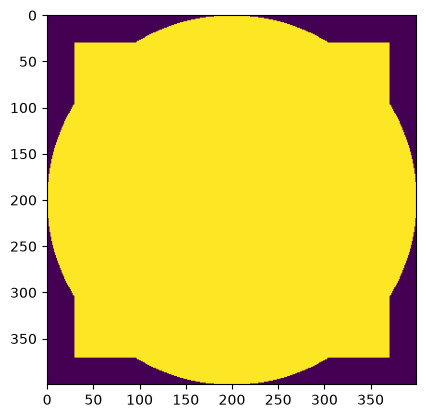

In [38]:
bitwise_or = cv.bitwise_or(rectangle, circle)
cv.imshow('Bitwise OR', bitwise_or)
plt.imshow(bitwise_or)

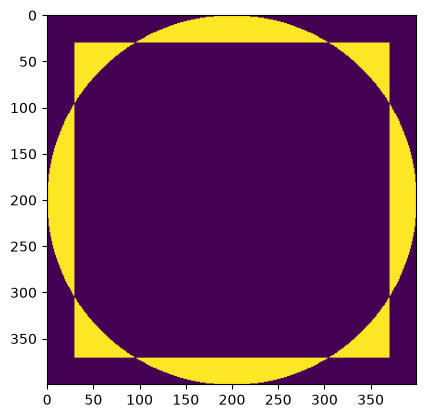

In [39]:
bitwise_xor = cv.bitwise_xor(rectangle, circle)
cv.imshow('Bitwise XOR', bitwise_xor)
plt.imshow(bitwise_xor)

`cv.bitwise_xor()` залишає області, які належать тільки одній з двох масок

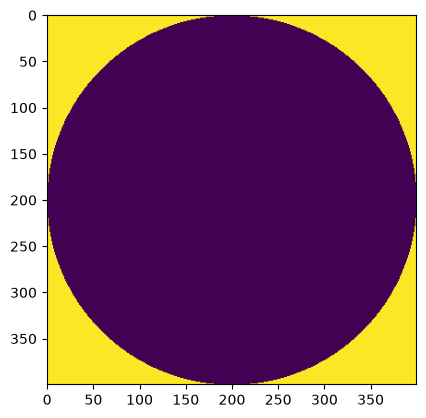

In [40]:
bitwise_not = cv.bitwise_not(circle)
cv.imshow('Circle NOT', bitwise_not)
plt.imshow(bitwise_not)

`cv.bitwise_not()` інвертує бінарне зображення: 0 перетворюється на 255, а 255 — на 0.

BLURRING

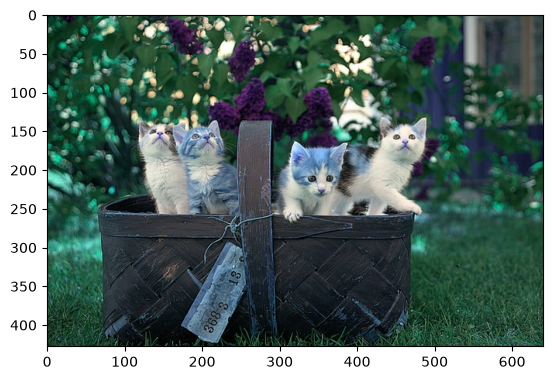

In [41]:
img = cv.imread('Resources/Photos/cats.jpg')
cv.imshow('Cats', img)
plt.imshow(img)

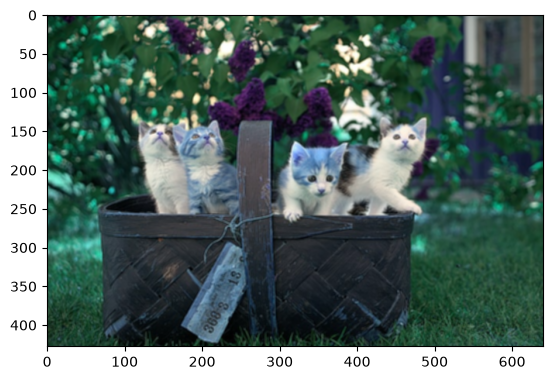

In [42]:
average = cv.blur(img, (3,3))
cv.imshow('Average Blur', average)
plt.imshow(average)

`cv.blur()` виконує просте усереднення сусідніх пікселів. більше ядро дає сильніше згладжування, але сильніше втрачає деталі.

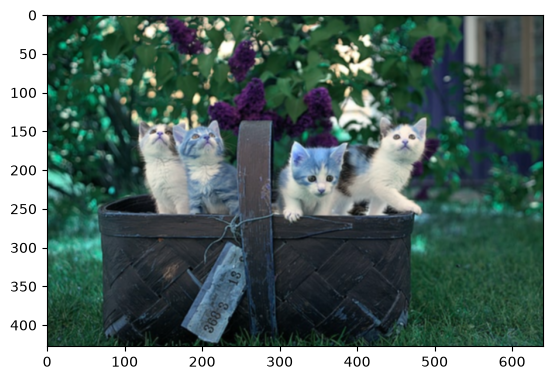

In [43]:
gauss = cv.GaussianBlur(img, (3,3), 0)
cv.imshow('Gaussian Blur', gauss)
plt.imshow(gauss)

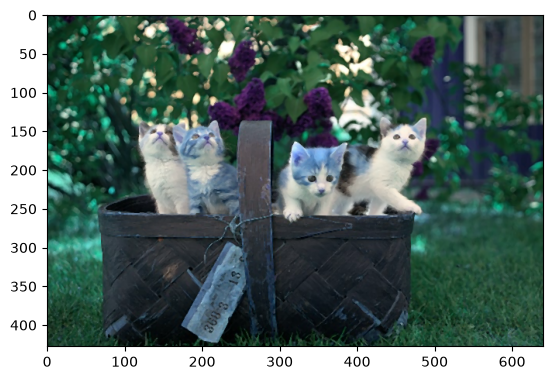

In [44]:
median = cv.medianBlur(img, 3)
cv.imshow('Median Blur', median)
plt.imshow(median)

`cv.medianBlur()` замінює кожний піксель сусідніх значень і добре прибирає імпульсний шум

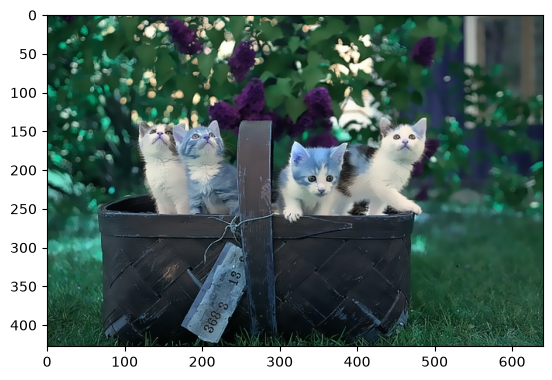

In [45]:
bilateral = cv.bilateralFilter(img, 10, 35, 25)
cv.imshow('Bilateral', bilateral)
plt.imshow(bilateral)

`cv.bilateralFilter()` згладжує однорідні області, але краще зберігає границі. параметри керують розміром сусідства, чутливістю до різниці кольору та просторової відстані.

COLOUR SPACES

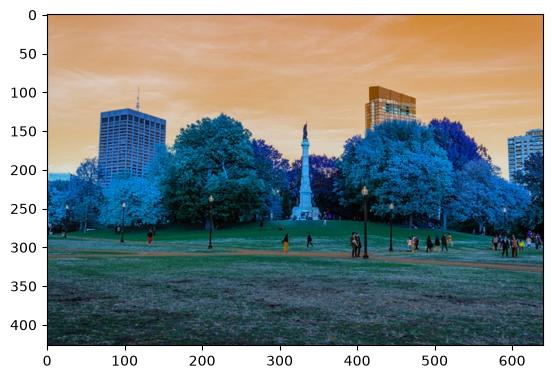

In [46]:
img = cv.imread('Resources/Photos/park.jpg')
cv.imshow('Park', img)
plt.imshow(img)

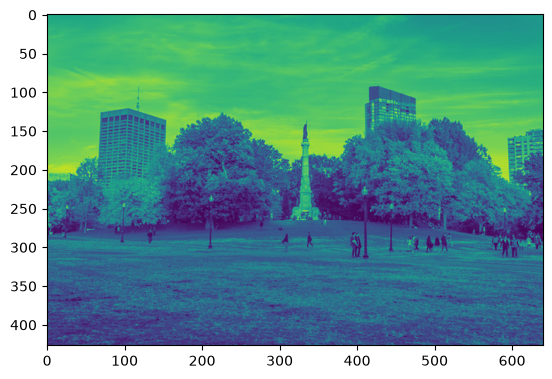

In [47]:
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
cv.imshow('Gray', gray)
plt.imshow(gray)

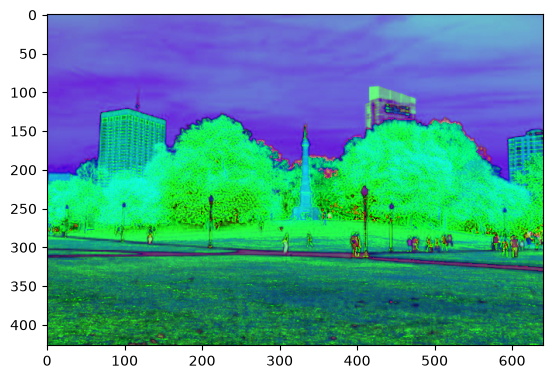

In [48]:
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)
cv.imshow('HSV', hsv)
plt.imshow(hsv)

перетворення BGR→HSV розділяє відтінок, насиченість і яскравість, HSV часто зручний для сегментації об'єктів за кольором

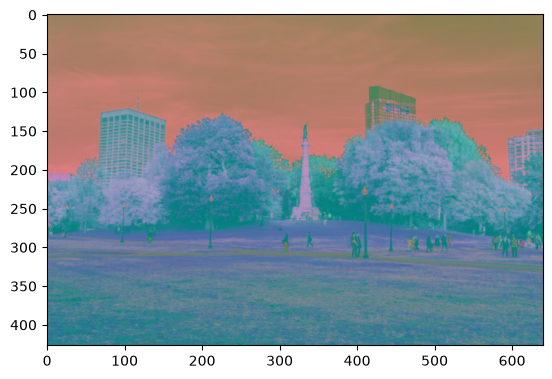

In [49]:
lab = cv.cvtColor(img, cv.COLOR_BGR2LAB)
cv.imshow('LAB', lab)
plt.imshow(lab)

перетворення BGR→LAB відокремлює світлоту `L` від кольорових компонент `A` і `B`, що корисно для аналізу кольору незалежно від освітленості.

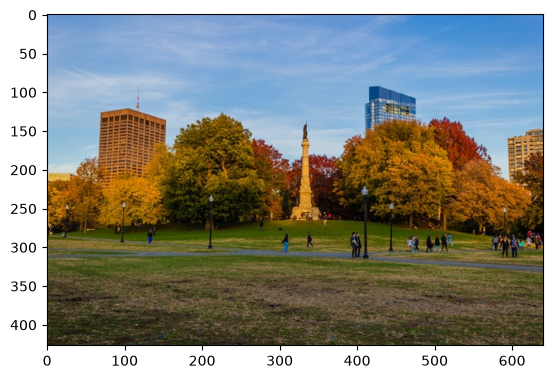

In [50]:
rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
cv.imshow('RGB', rgb)
plt.imshow(rgb)

перетворення BGR→RGB змінює порядок кольорових каналів і потрібне для коректного показу OpenCV-зображень через Matplotlib.

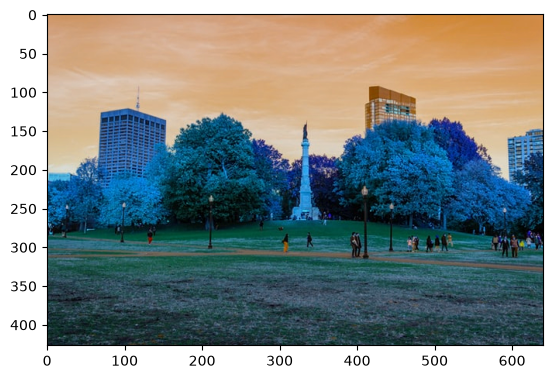

In [51]:
lab_bgr = cv.cvtColor(lab, cv.COLOR_LAB2BGR)
cv.imshow('LAB --> BGR', lab_bgr)
plt.imshow(lab_bgr)

GRADIENTS

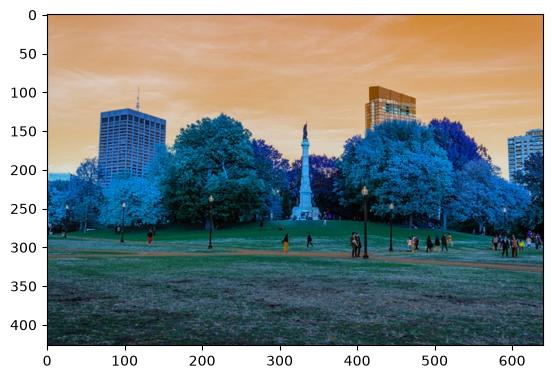

In [52]:
img = cv.imread('Resources/Photos/park.jpg')
cv.imshow('Park', img)
plt.imshow(img)

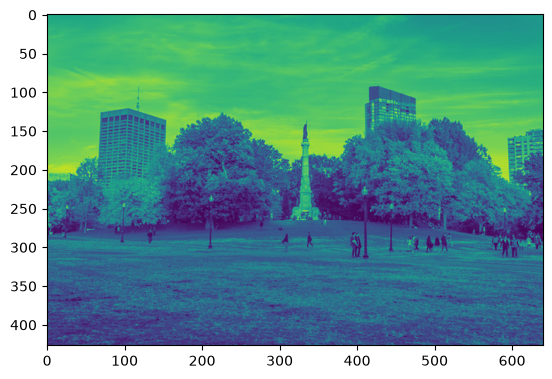

In [53]:
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
cv.imshow('Gray', gray)
plt.imshow(gray)

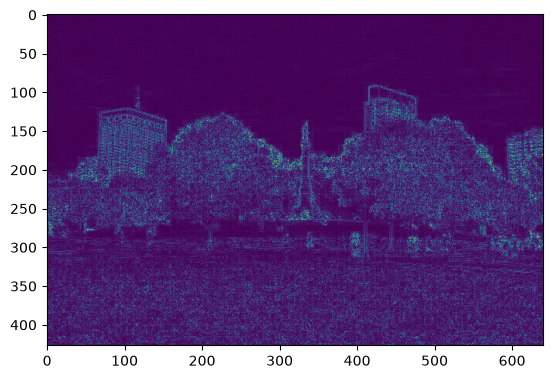

In [54]:
lap = cv.Laplacian(gray, cv.CV_64F)
lap = np.uint8(np.absolute(lap))
cv.imshow('Laplacian', lap)
plt.imshow(lap)

`cv.Laplacian()` оцінює другу просторову похідну інтенсивності та підкреслює різкі зміни яскравості. `CV_64F` дозволяє тимчасово зберігати від'ємні значення градієнта.

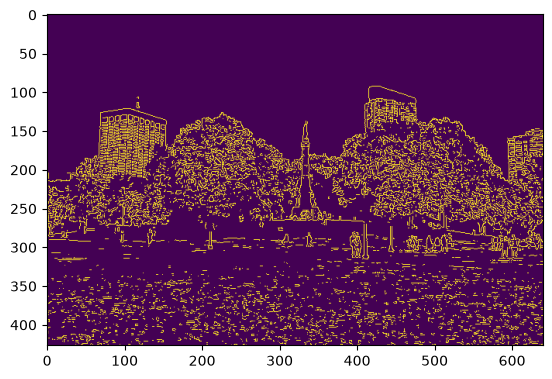

In [55]:
sobelx = cv.Sobel(gray, cv.CV_64F, 1, 0)
sobely = cv.Sobel(gray, cv.CV_64F, 0, 1)
combined_sobel = cv.bitwise_or(sobelx, sobely)

cv.imshow('Sobel X', sobelx)
cv.imshow('Sobel Y', sobely)
cv.imshow('Combined Sobel', combined_sobel)

canny = cv.Canny(gray, 150, 175)
cv.imshow('Canny', canny)
plt.imshow(canny)

`cv.Sobel()` окремо обчислює градієнти по X і Y. зміна порядку похідних дозволяє виділяти переважно вертикальні або горизонтальні границі

HISTOGRAM

In [56]:
img = cv.imread('Resources/Photos/cats.jpg')
cv.imshow('Cats', img)

blank = np.zeros(img.shape[:2], dtype='uint8')

In [57]:
mask = cv.circle(blank, (img.shape[1]//2,img.shape[0]//2), 100, 255, -1)

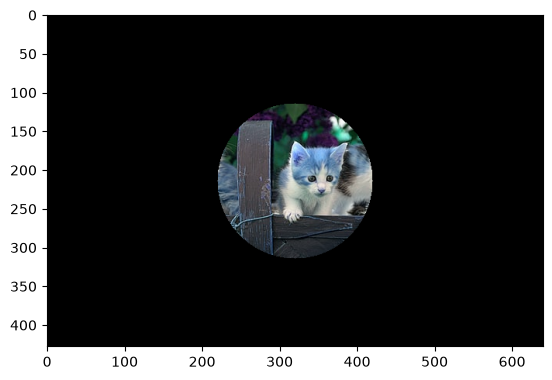

In [58]:
masked = cv.bitwise_and(img,img,mask=mask)
cv.imshow('Mask', masked)
plt.imshow(masked)

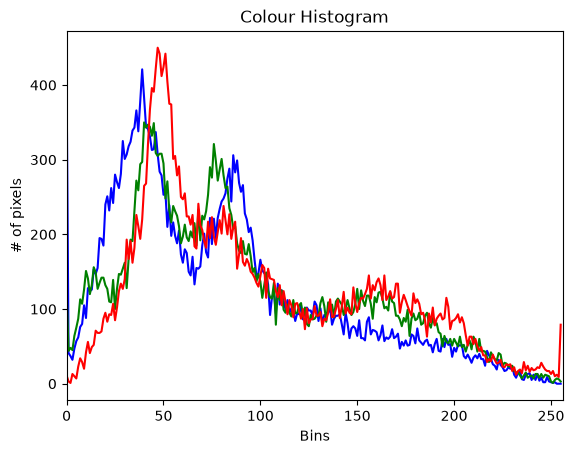

In [59]:
plt.figure()
plt.title('Colour Histogram')
plt.xlabel('Bins')
plt.ylabel('# of pixels')
colors = ('b', 'g', 'r')
for i,col in enumerate(colors):
    hist = cv.calcHist([img], [i], mask, [256], [0,256])
    plt.plot(hist, color=col)
    plt.xlim([0,256])

plt.show()

`cv.calcHist()` обчислює гістограму розподілу інтенсивностей. `[256]` задає кількість bins, `[0,256]` — діапазон значень, а `mask` дозволяє рахувати статистику тільки для вибраної області

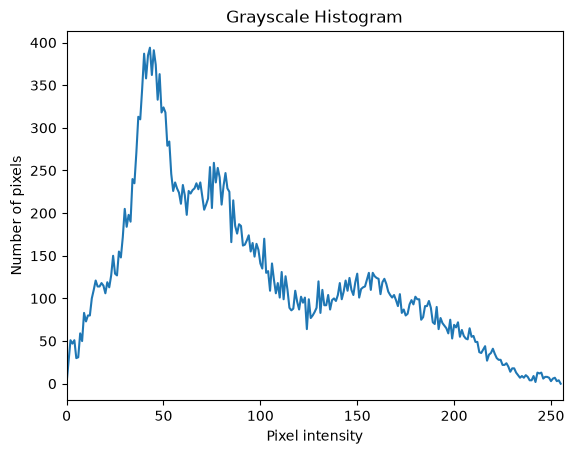

In [60]:
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

mask = np.zeros(gray.shape, dtype='uint8')

cv.circle(
    mask,
    (gray.shape[1] // 2, gray.shape[0] // 2),
    100,
    255,
    -1
)

gray_hist = cv.calcHist(
    [gray],
    [0],
    mask,
    [256],
    [0, 256]
)

plt.figure()
plt.title('Grayscale Histogram')
plt.xlabel('Pixel intensity')
plt.ylabel('Number of pixels')
plt.plot(gray_hist)
plt.xlim([0, 256])
plt.show()

MASKING

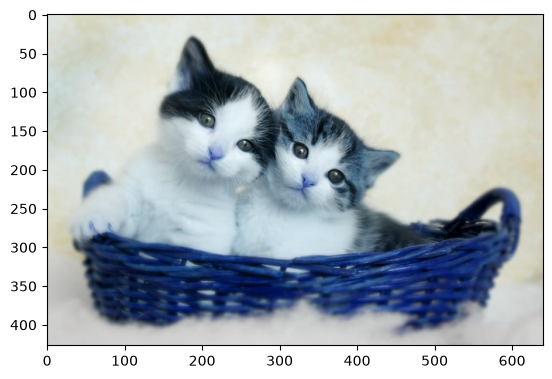

In [61]:
img = cv.imread('Resources/Photos/cats 2.jpg')
plt.imshow(img)

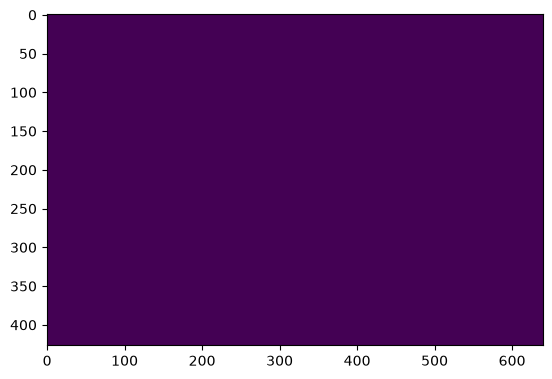

In [62]:
blank = np.zeros(img.shape[:2], dtype='uint8')
plt.imshow(blank)

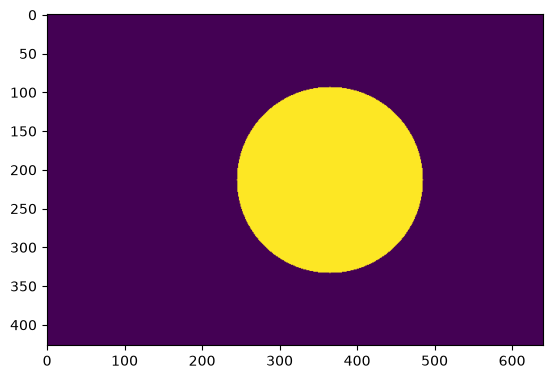

In [63]:
circle = cv.circle(blank.copy(), (img.shape[1]//2 + 45,img.shape[0]//2), 120, 255, -1)
plt.imshow(circle)

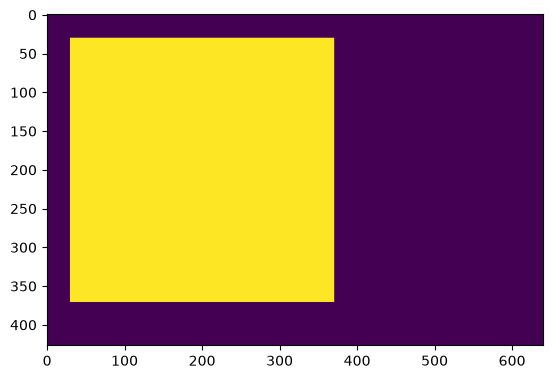

In [64]:
rectangle = cv.rectangle(blank.copy(), (30,30), (370,370), 255, -1)
plt.imshow(rectangle)

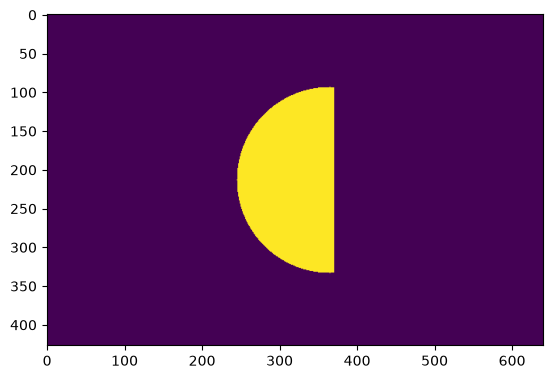

In [65]:
weird_shape = cv.bitwise_and(circle,rectangle)
plt.imshow(weird_shape)

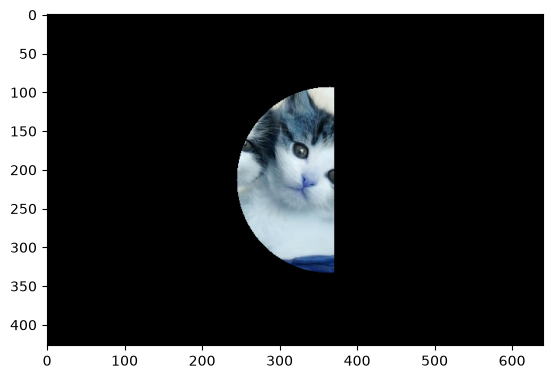

In [66]:
masked = cv.bitwise_and(img,img,mask=weird_shape)
plt.imshow(masked)

RESCALE_RESIZE

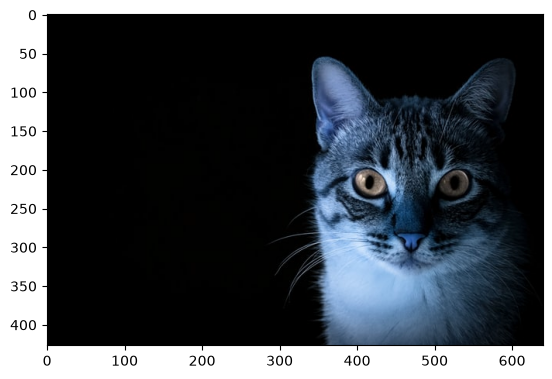

In [67]:
img = cv.imread('Resources/Photos/cat.jpg')
plt.imshow(img)

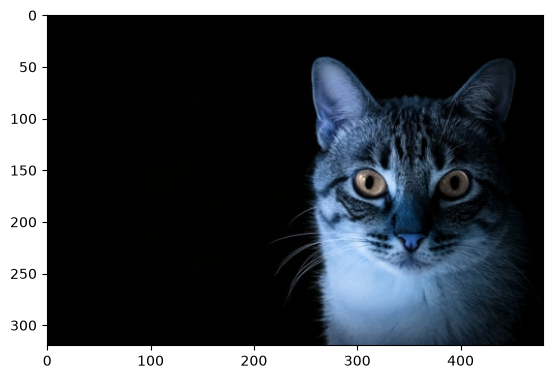

In [68]:
def rescaleFrame(frame, scale=0.75):
    # Images, Videos and Live Video
    width = int(frame.shape[1] * scale)
    height = int(frame.shape[0] * scale)

    dimensions = (width,height)

    return cv.resize(frame, dimensions, interpolation=cv.INTER_AREA)

plt.imshow(rescaleFrame(img))

`rescaleFrame()` обчислює нові ширину та висоту кадру через коефіцієнт `scale`. значення `0.75` залишає 75% початкової ширини й висоти

In [70]:
capture = cv.VideoCapture('Resources/Videos/dog.mp4')
while True:
    isTrue, frame = capture.read()

    frame_resized = rescaleFrame(frame, scale=.2)
    
    cv.imshow('Video', frame)
    cv.imshow('Video Resized', frame_resized)

    if cv.waitKey(20) & 0xFF==ord('d'):
        break

capture.release()
cv.destroyAllWindows()

AttributeError: 'NoneType' object has no attribute 'shape'

SPLIT_MERGE

In [ ]:
img = cv.imread('Resources/Photos/park.jpg')
cv.imshow('Park', img)
plt.imshow(img)

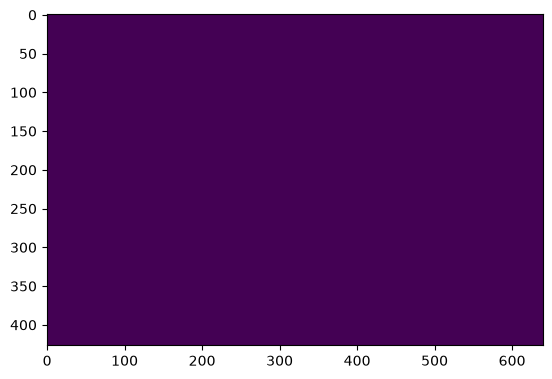

In [71]:
blank = np.zeros(img.shape[:2], dtype='uint8')
plt.imshow(blank)

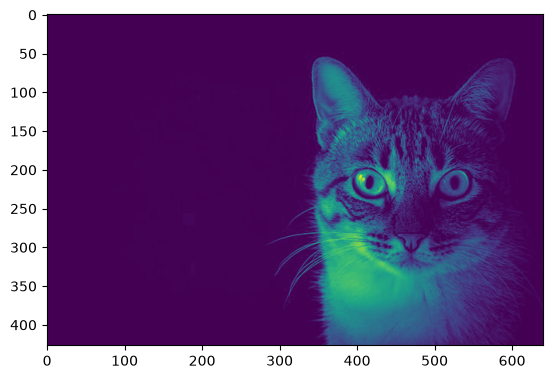

In [72]:
b,g,r = cv.split(img)
plt.imshow(b)

`cv.split()` розділяє BGR-зображення на три одноканальні масиви: синій, зелений і червоний

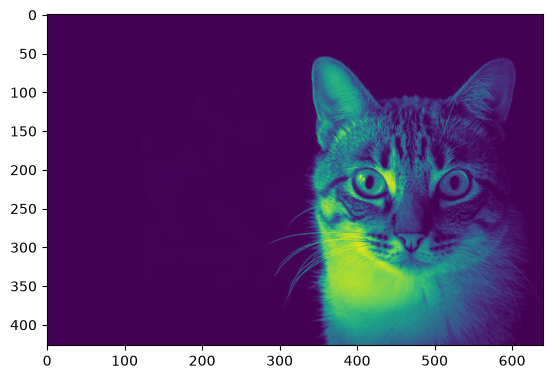

In [73]:
plt.imshow(g)

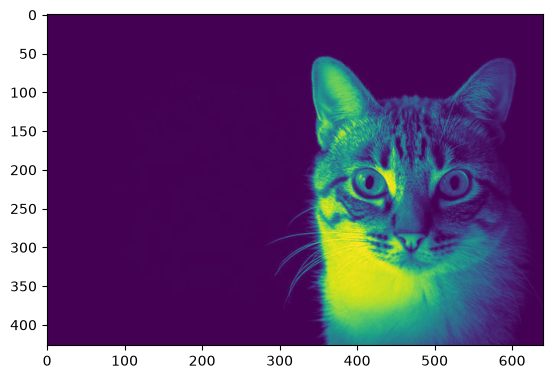

In [74]:
plt.imshow(r)

In [75]:
red = cv.merge([r,blank,blank])
green = cv.merge([blank,g,blank])
blue = cv.merge([blank,blank,b])

`cv.merge()` об'єднує окремі одноканальні масиви назад у багатоканальне зображення. порядок масивів визначає порядок кольорових каналів

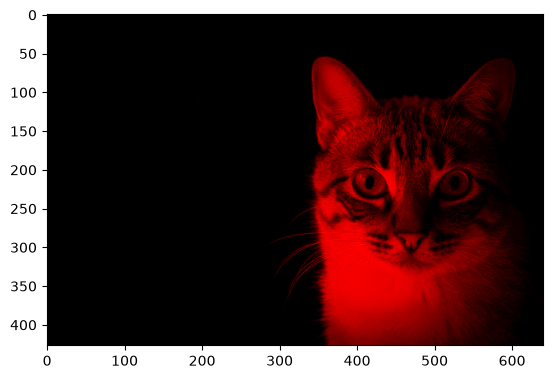

In [76]:
plt.imshow(red)

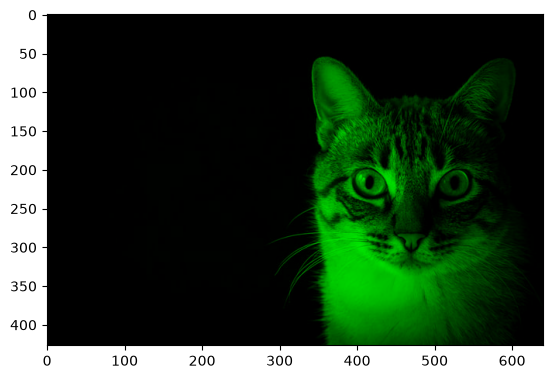

In [77]:
plt.imshow(green)

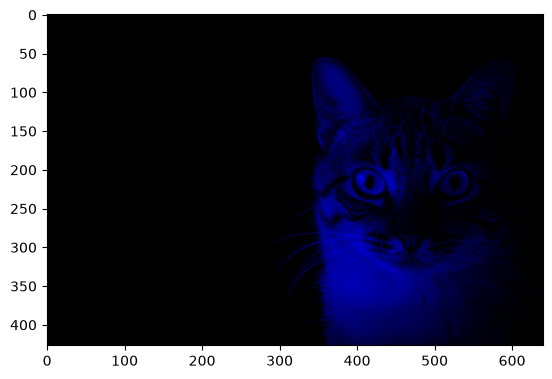

In [78]:
plt.imshow(blue)

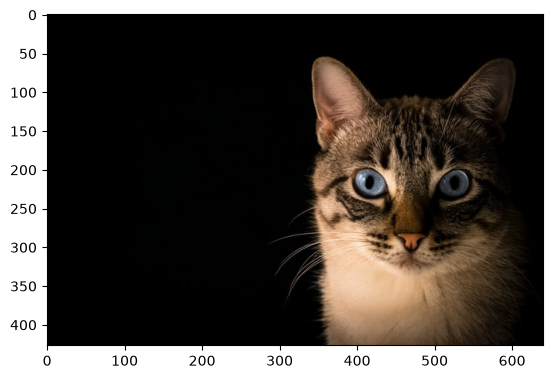

In [79]:
merged_image = cv.merge([r,g,b])
plt.imshow(merged_image)

SECTION 3

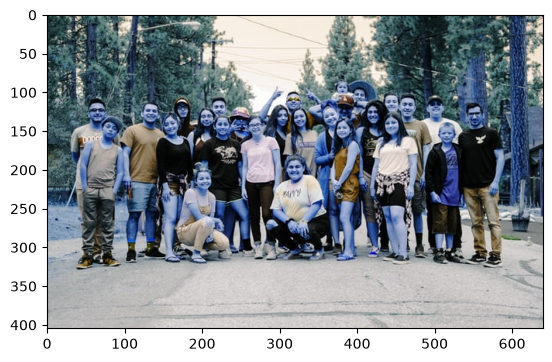

In [80]:
img = cv.imread('Resources/Photos/group 1.jpg')
plt.imshow(img)

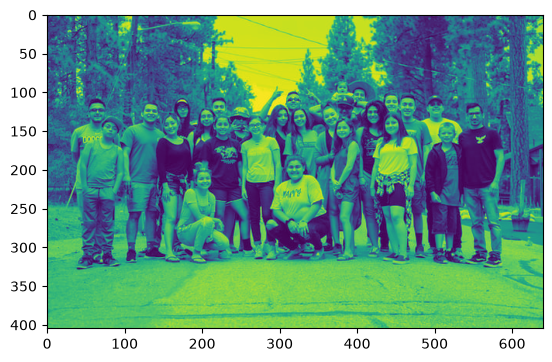

In [81]:
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
plt.imshow(gray)

In [82]:
import os

for root, dirs, files in os.walk('.'):
    if 'haar_face.xml' in files:
        print(os.path.join(root, 'haar_face.xml'))

.\Section #3 - Faces\haar_face.xml


`os.walk()` рекурсивно обходить каталоги та допомагає знайти файл `haar_face.xml`, якщо його точне розташування невідоме.

In [83]:
haar_path = r'Section #3 - Faces\haar_face.xml'

haar_cascade = cv.CascadeClassifier(haar_path)

print("Cascade loaded:", not haar_cascade.empty())

Cascade loaded: True


`cv.CascadeClassifier()` завантажує Haar Cascade з XML-файла. метод `empty()` дозволяє перевірити, чи класифікатор завантажився успішно.

In [84]:
faces_rect = haar_cascade.detectMultiScale(
    gray,
    scaleFactor=1.1,
    minNeighbors=4
)

print(f'Number of faces found = {len(faces_rect)}')

Number of faces found = 10


`detectMultiScale()` шукає обличчя на різних масштабах. `scaleFactor=1.1` задає крок зміни масштабу, а `minNeighbors=4` визначає суворість підтвердження детекції; більше значення зазвичай зменшує хибні спрацювання.

Cascade loaded: True
Number of faces found = 10


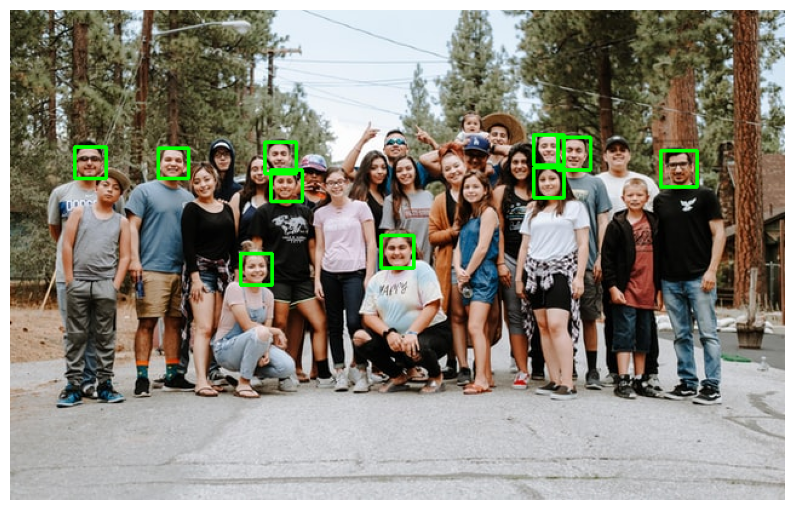

In [85]:
img = cv.imread('Resources/Photos/group 1.jpg')

if img is None:
    print("Image not found")
else:
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    haar_path = r'Section #3 - Faces\haar_face.xml'
    haar_cascade = cv.CascadeClassifier(haar_path)

    print("Cascade loaded:", not haar_cascade.empty())

    if not haar_cascade.empty():
        faces_rect = haar_cascade.detectMultiScale(
            gray,
            scaleFactor=1.1,
            minNeighbors=4
        )

        print(f'Number of faces found = {len(faces_rect)}')

        for (x, y, w, h) in faces_rect:
            cv.rectangle(
                img,
                (x, y),
                (x + w, y + h),
                (0, 255, 0),
                thickness=2
            )

        img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

        plt.figure(figsize=(10, 7))
        plt.imshow(img_rgb)
        plt.axis('off')
        plt.show()

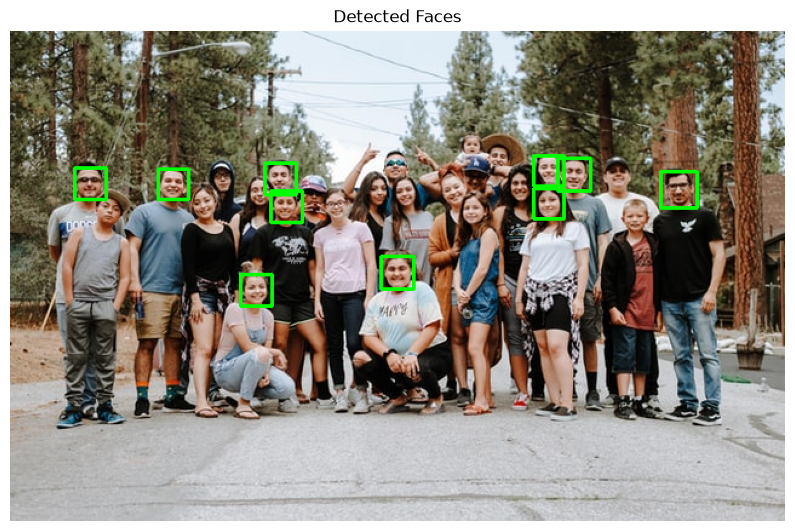

In [86]:
for (x, y, w, h) in faces_rect:
    cv.rectangle(
        img,
        (x, y),
        (x + w, y + h),
        (0, 255, 0),
        thickness=2
    )

img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

plt.figure(figsize=(10, 7))
plt.imshow(img_rgb)
plt.title('Detected Faces')
plt.axis('off')
plt.show()

FACE_RECOGNITION

In [87]:
haar_cascade = cv.CascadeClassifier('section #3 - faces/haar_face.xml')

In [88]:
people = ['Ben Afflek', 'Elton John', 'Jerry Seinfield', 'Madonna', 'Mindy Kaling']

In [89]:
face_recognizer = cv.face.LBPHFaceRecognizer_create()
face_recognizer.read('section #3 - faces/face_trained.yml')

`cv.face.LBPHFaceRecognizer_create()` створює розпізнавач облич. алгоритм описує локальні текстурні патерни і порівнює їх із навчальними прикладами

In [90]:
img = cv.imread(r'Resources/Faces/val/elton_john/1.jpg')

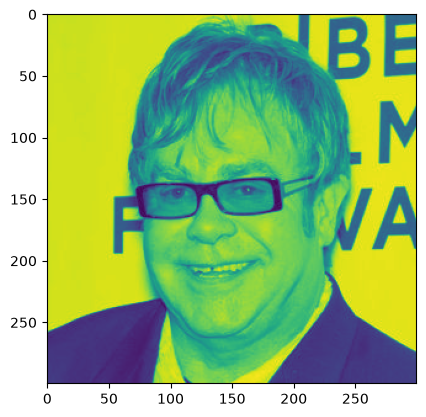

In [91]:
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
plt.imshow(gray)

In [92]:
faces_rect = haar_cascade.detectMultiScale(gray, 1.1, 4)
print(faces_rect)

[[ 54  80 175 175]]


Label = Elton John with a confidence of 67.0085680686467


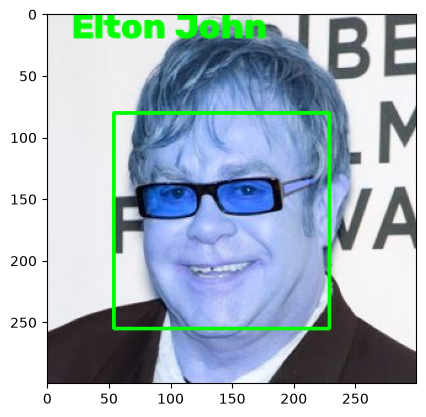

In [93]:
for (x,y,w,h) in faces_rect:
    faces_roi = gray[y:y+h,x:x+w]

    label, confidence = face_recognizer.predict(faces_roi)
    print(f'Label = {people[label]} with a confidence of {confidence}')

    cv.putText(img, str(people[label]), (20,20), cv.FONT_HERSHEY_COMPLEX, 1.0, (0,255,0), thickness=2)
    cv.rectangle(img, (x,y), (x+w,y+h), (0,255,0), thickness=2)

plt.imshow(img)

`face_recognizer.predict()` повертає прогнозовану мітку, для цього алгоритму менше значення distance зазвичай означає кращу відповідність навчальному класу.

FACES_TRAINED

In [94]:
DIR = r'Resources\Faces\train'

In [95]:
people = ['Ben Afflek', 'Elton John', 'Jerry Seinfield', 'Madonna', 'Mindy Kaling']

features = []
labels = []

def create_train():
    for person in people:
        path = os.path.join(DIR, person)
        label = people.index(person)

        for img in os.listdir(path):
            img_path = os.path.join(path, img)

            img_array = cv.imread(img_path)

            if img_array is None:
                continue

            gray = cv.cvtColor(img_array, cv.COLOR_BGR2GRAY)

            faces_rect = haar_cascade.detectMultiScale(
                gray,
                scaleFactor=1.1,
                minNeighbors=4
            )

            for (x, y, w, h) in faces_rect:
                faces_roi = gray[y:y+h, x:x+w]

                features.append(faces_roi)
                labels.append(label)

create_train()

print('Training done')
print('Features:', len(features))
print('Labels:', len(labels))

Training done
Features: 100
Labels: 100


`create_train()` проходить по навчальних папках, знаходить обличчя Haar Cascade, вирізає ROI та формує списки `features` і `labels` для подальшого навчання

In [96]:
features = np.array(features, dtype='object')
labels = np.array(labels)

In [97]:
print(features)
print(labels)

[array([[100,  68,   1, ...,  16,  22,  23],
        [ 90,  78,   2, ...,  13,   7,  11],
        [ 92,  56,   1, ...,   3,   2,   8],
        ...,
        [ 48,  24,  12, ...,  24,  24,  19],
        [ 28,  17,  13, ...,  32,  22,  22],
        [ 11,  14,  17, ...,  25,  22,  22]], shape=(73, 73), dtype=uint8)
 array([[18, 17, 18, ...,  1,  1,  5],
        [19, 18, 19, ...,  1,  2,  5],
        [20, 19, 19, ...,  2,  2,  5],
        ...,
        [54, 53, 53, ...,  7,  8,  8],
        [56, 55, 53, ...,  7,  7,  7],
        [56, 55, 54, ...,  7,  7,  7]], shape=(162, 162), dtype=uint8)
 array([[ 21,   6,  18, ...,  32,  30,  25],
        [ 12,   7,  20, ...,  31,  28,  24],
        [ 15,  10,  20, ...,  33,  29,  23],
        ...,
        [105, 106,  76, ...,  21,  22,  23],
        [117,  99,  83, ...,  21,  22,  23],
        [113, 113,  88, ...,  22,  23,  24]], shape=(98, 98), dtype=uint8)
 array([[ 94,  65,  45, ...,  86,  83,  89],
        [ 95,  65,  46, ..., 104,  93,  78],
     

In [98]:
face_recognizer = cv.face.LBPHFaceRecognizer_create()

In [99]:
face_recognizer.train(features,labels)

`face_recognizer.train()` навчає модель на підготовлених областях облич і відповідних числових мітках.

In [100]:
face_recognizer.save('face_trained.yml')

`face_recognizer.save()` зберігає навчену модель у файл, щоб надалі використовувати її без повторного навчання.

In [101]:
np.save('features.npy', features)
np.save('labels.npy', labels)

`np.save()` окремо зберігає масиви ознак і міток у форматі `.npy` для повторного використання.

SECTION 4 

In [102]:
from pathlib import Path
import kagglehub
import os


# створення локальної папки для датасету


DATA_ROOT = Path("data")

DATA_ROOT.mkdir(
    parents=True,
    exist_ok=True
)

# завантаження набору The Simpsons Characters Dataset


dataset_path = kagglehub.dataset_download(
    "alexattia/the-simpsons-characters-dataset",
    output_dir=str(DATA_ROOT)
)

dataset_path = Path(dataset_path)

print("Dataset downloaded.")
print("Root:", dataset_path.resolve())



# пошук потрібних папок усередині датасету

def find_directory(root, directory_name):

    matches = [
        path
        for path in root.rglob(directory_name)
        if path.is_dir()
    ]

    if not matches:
        raise FileNotFoundError(
            f"Could not find '{directory_name}' "
            f"inside {root}"
        )

    return matches[0]


DATA_DIR = find_directory(
    dataset_path,
    "simpsons_dataset"
)

TEST_DIR = find_directory(
    dataset_path,
    "kaggle_simpson_testset"
)

#перевірка


print()
print("Training directory:")
print(DATA_DIR)

print()
print("Test directory:")
print(TEST_DIR)

print()
print("Training directory exists:", DATA_DIR.exists())
print("Test directory exists:", TEST_DIR.exists())

100%|██████████| 1.08G/1.08G [00:38<00:00, 30.1MB/s]

Extracting files...


Dataset downloaded.
Root: D:\Illia\Vlad\open_cv\opencv-course\data

Training directory:
data\simpsons_dataset

Test directory:
data\kaggle_simpson_testset

Training directory exists: True
Test directory exists: True


`kagglehub.dataset_download()` автоматично завантажує набір The Simpsons Characters Dataset. `find_directory()` після завантаження шукає навчальну та тестову папки

In [103]:
from pathlib import Path

IMAGE_EXTENSIONS = {".jpg", ".jpeg", ".png", ".bmp"}

class_counts = {}

for class_dir in DATA_DIR.iterdir():
    if class_dir.is_dir():

        image_files = [
            file
            for file in class_dir.iterdir()
            if file.suffix.lower() in IMAGE_EXTENSIONS
        ]

        class_counts[class_dir.name] = len(image_files)

print("Number of classes:", len(class_counts))

Number of classes: 43


підрахунок файлів у кожній папці формує `class_counts` і дозволяє побачити, наскільки збалансовано представлені персонажі в датасеті

In [104]:
sorted_counts = sorted(
    class_counts.items(),
    key=lambda item: item[1],
    reverse=True
)

for character, count in sorted_counts[:20]:
    print(f"{character:35s} {count}")

homer_simpson                       2246
ned_flanders                        1454
moe_szyslak                         1452
lisa_simpson                        1354
bart_simpson                        1342
marge_simpson                       1291
krusty_the_clown                    1206
principal_skinner                   1194
charles_montgomery_burns            1193
milhouse_van_houten                 1079
chief_wiggum                        986
abraham_grampa_simpson              913
sideshow_bob                        877
apu_nahasapeemapetilon              623
kent_brockman                       498
comic_book_guy                      469
edna_krabappel                      457
nelson_muntz                        358
lenny_leonard                       310
mayor_quimby                        246


In [105]:
NUM_CLASSES = 10

characters = [
    character
    for character, count in sorted_counts[:NUM_CLASSES]
]

print("Selected characters:")

for index, character in enumerate(characters):
    print(f"{index}: {character}")

Selected characters:
0: homer_simpson
1: ned_flanders
2: moe_szyslak
3: lisa_simpson
4: bart_simpson
5: marge_simpson
6: krusty_the_clown
7: principal_skinner
8: charles_montgomery_burns
9: milhouse_van_houten


вибір 10 найчисельніших класів зменшує дисбаланс і обчислювальні витрати. збільшення `NUM_CLASSES` робить задачу складнішою, але дозволяє розпізнавати більше персонажів

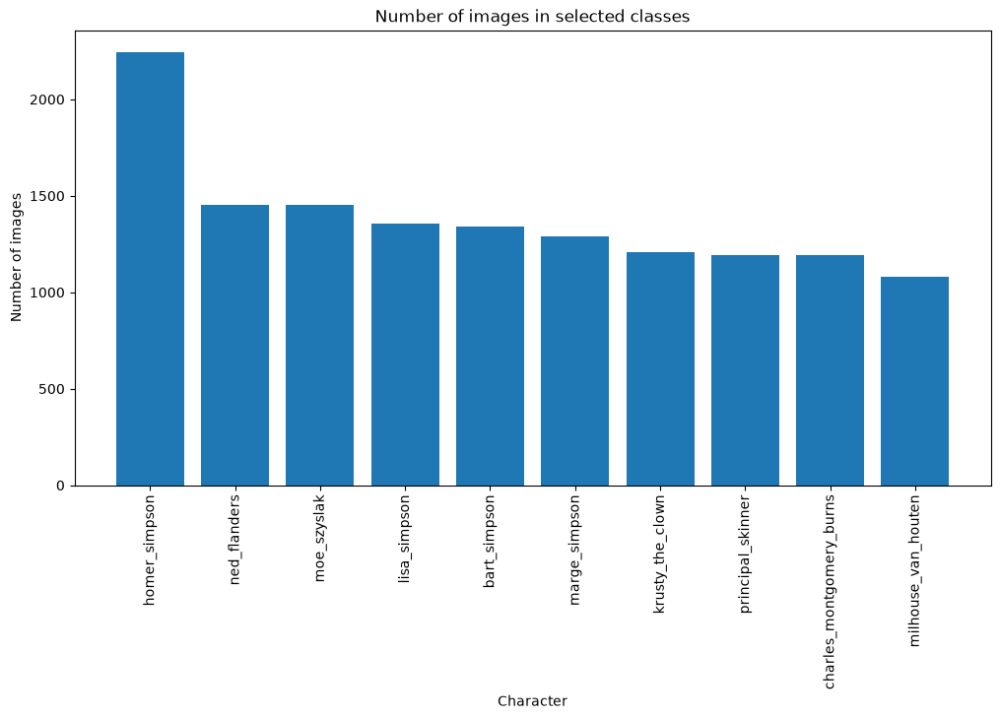

In [106]:
selected_counts = [
    class_counts[character]
    for character in characters
]

plt.figure(figsize=(12, 6))

plt.bar(
    characters,
    selected_counts
)

plt.title("Number of images in selected classes")
plt.xlabel("Character")
plt.ylabel("Number of images")

plt.xticks(rotation=90)

plt.show()

In [110]:
IMG_SIZE = (80, 80)

MAX_IMAGES_PER_CLASS = 500

IMAGE_EXTENSIONS = {".jpg", ".jpeg", ".png", ".bmp"}


def load_dataset(root_dir, class_names, max_per_class=None):
    

    features = []
    labels = []
    skipped_images = 0

    for label, class_name in enumerate(class_names):

        class_path = root_dir / class_name

        image_paths = [
            path
            for path in class_path.iterdir()
            if path.suffix.lower() in IMAGE_EXTENSIONS
        ]

        image_paths = sorted(image_paths)

        if max_per_class is not None:
            image_paths = image_paths[:max_per_class]

        print(f"Loading {class_name}: {len(image_paths)} images")

        for image_path in image_paths:

           
            image = cv.imread(str(image_path))

            
            if image is None:
                skipped_images += 1
                continue

            
            gray = cv.cvtColor(
                image,
                cv.COLOR_BGR2GRAY
            )

            
            resized = cv.resize(
                gray,
                IMG_SIZE,
                interpolation=cv.INTER_AREA
            )

            features.append(resized)
            labels.append(label)

    
    X = np.array(
        features,
        dtype=np.uint8
    )

    y = np.array(
        labels,
        dtype=np.int32
    )

   
    X = np.expand_dims(
        X,
        axis=-1
    )

    return X, y, skipped_images


X, y, skipped = load_dataset(
    DATA_DIR,
    characters,
    MAX_IMAGES_PER_CLASS
)

print()
print("Dataset loaded successfully.")
print("X shape:", X.shape)
print("y shape:", y.shape)
print("Skipped images:", skipped)

Loading homer_simpson: 500 images
Loading ned_flanders: 500 images
Loading moe_szyslak: 500 images
Loading lisa_simpson: 500 images
Loading bart_simpson: 500 images
Loading marge_simpson: 500 images
Loading krusty_the_clown: 500 images
Loading principal_skinner: 500 images
Loading charles_montgomery_burns: 500 images
Loading milhouse_van_houten: 500 images

Dataset loaded successfully.
X shape: (5000, 80, 80, 1)
y shape: (5000,)
Skipped images: 0


`load_dataset()` формує `X` і `y`, читає зображення, переводить їх у grayscale, приводить до розміру `80×80` та присвоює числові мітки класів. `MAX_IMAGES_PER_CLASS` обмежує кількість прикладів одного персонажа й допомагає контролювати обсяг даних

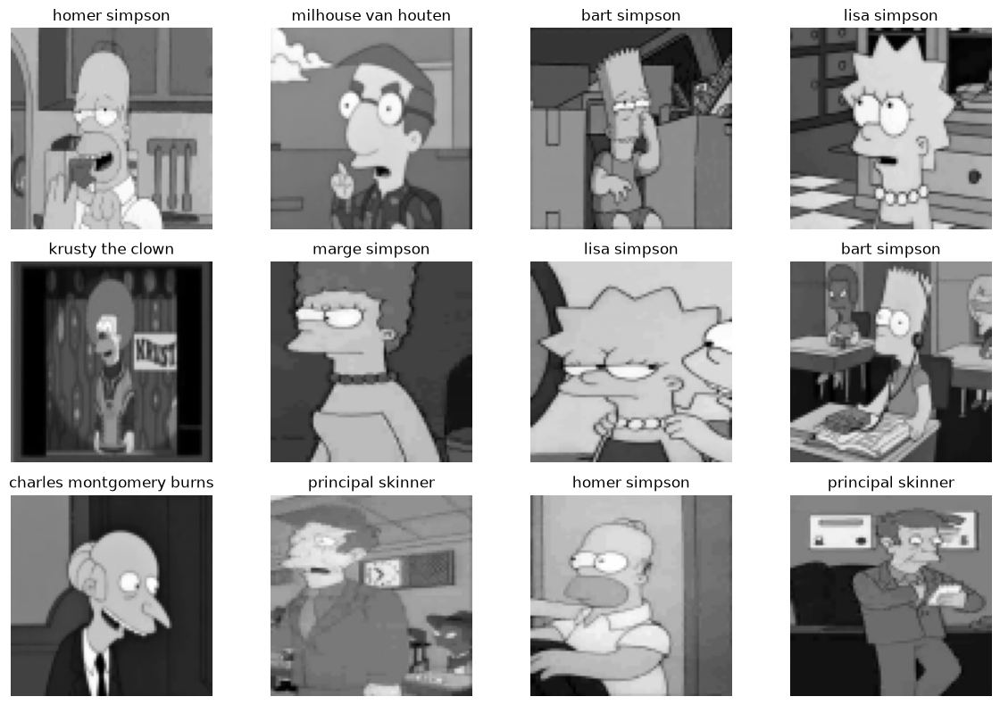

In [111]:
import matplotlib.pyplot as plt
import numpy as np

sample_indices = np.random.choice(
    len(X),
    size=12,
    replace=False
)

plt.figure(figsize=(12, 8))

for plot_index, dataset_index in enumerate(sample_indices):

    plt.subplot(3, 4, plot_index + 1)

    plt.imshow(
        X[dataset_index].squeeze(),
        cmap='gray'
    )

    plt.title(
        characters[y[dataset_index]].replace('_', ' ')
    )

    plt.axis('off')

plt.tight_layout()
plt.show()

In [112]:
print("Before normalization:")
print("Minimum pixel value:", X.min())
print("Maximum pixel value:", X.max())
print("Data type:", X.dtype)

X = X.astype('float32') / 255.0

print()
print("After normalization:")
print("Minimum pixel value:", X.min())
print("Maximum pixel value:", X.max())
print("Data type:", X.dtype)

Before normalization:
Minimum pixel value: 0
Maximum pixel value: 255
Data type: uint8

After normalization:
Minimum pixel value: 0.0
Maximum pixel value: 1.0
Data type: float32


нормалізація `X.astype('float32') / 255.0` переводить пікселі з діапазону 0–255 у 0–1
це робить числовий масштаб входів стабільнішим для навчання нейромережі

In [113]:
from sklearn.model_selection import train_test_split
SEED = 42

x_train, x_val, y_train, y_val = train_test_split(
    X,
    y,
    test_size=0.20,
    random_state=SEED,
    stratify=y,
    shuffle=True
)

print("Training dataset:")
print("x_train:", x_train.shape)
print("y_train:", y_train.shape)

print()

print("Validation dataset:")
print("x_val:", x_val.shape)
print("y_val:", y_val.shape)

Training dataset:
x_train: (4000, 80, 80, 1)
y_train: (4000,)

Validation dataset:
x_val: (1000, 80, 80, 1)
y_val: (1000,)


In [114]:
unique_train, counts_train = np.unique(
    y_train,
    return_counts=True
)

unique_val, counts_val = np.unique(
    y_val,
    return_counts=True
)

print("TRAIN:")
for label, count in zip(unique_train, counts_train):
    print(
        characters[label],
        "->",
        count
    )

print()

print("VALIDATION:")
for label, count in zip(unique_val, counts_val):
    print(
        characters[label],
        "->",
        count
    )

TRAIN:
homer_simpson -> 400
ned_flanders -> 400
moe_szyslak -> 400
lisa_simpson -> 400
bart_simpson -> 400
marge_simpson -> 400
krusty_the_clown -> 400
principal_skinner -> 400
charles_montgomery_burns -> 400
milhouse_van_houten -> 400

VALIDATION:
homer_simpson -> 100
ned_flanders -> 100
moe_szyslak -> 100
lisa_simpson -> 100
bart_simpson -> 100
marge_simpson -> 100
krusty_the_clown -> 100
principal_skinner -> 100
charles_montgomery_burns -> 100
milhouse_van_houten -> 100


In [115]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

data_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.05),
        layers.RandomZoom(0.10),
    ],
    name="data_augmentation"
)

print("Data augmentation created successfully.")

Data augmentation created successfully.


блок data augmentation випадково віддзеркалює, повертає та масштабує навчальні зображення. це збільшує різноманітність прикладів і зменшує ризик перенавчання; альтернативи — Albumentations і TorchVision transforms.

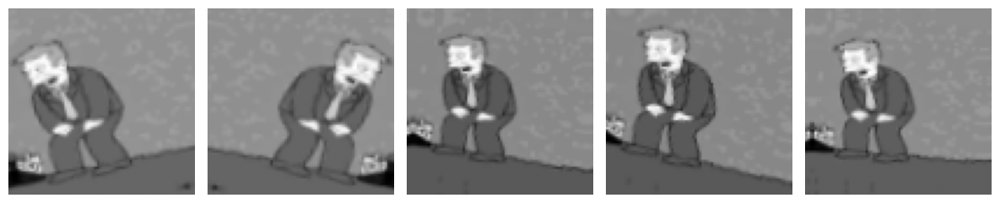

In [116]:
sample = x_train[0:1]

plt.figure(figsize=(12, 3))

for i in range(5):

    augmented = data_augmentation(
        sample,
        training=True
    )

    plt.subplot(1, 5, i + 1)

    plt.imshow(
        augmented[0].numpy().squeeze(),
        cmap="gray"
    )

    plt.axis("off")

plt.tight_layout()
plt.show()

In [117]:
NUM_CLASSES = len(characters)

INPUT_SHAPE = (
    IMG_SIZE[1],
    IMG_SIZE[0],
    1
)

model = keras.Sequential(
    [
        layers.Input(shape=INPUT_SHAPE),

        data_augmentation,

        # Block 1
        layers.Conv2D(
            32,
            kernel_size=(3, 3),
            padding="same",
            activation="relu"
        ),

        layers.MaxPooling2D(
            pool_size=(2, 2)
        ),

        # Block 2
        layers.Conv2D(
            64,
            kernel_size=(3, 3),
            padding="same",
            activation="relu"
        ),

        layers.MaxPooling2D(
            pool_size=(2, 2)
        ),

        # Block 3
        layers.Conv2D(
            128,
            kernel_size=(3, 3),
            padding="same",
            activation="relu"
        ),

        layers.MaxPooling2D(
            pool_size=(2, 2)
        ),

        layers.Dropout(0.30),

        layers.Flatten(),

        layers.Dense(
            256,
            activation="relu"
        ),

        layers.Dropout(0.50),

        layers.Dense(
            NUM_CLASSES,
            activation="softmax"
        )
    ]
)

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ data_augmentation (Sequential)       │ (None, 80, 80, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 80, 80, 32)          │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 40, 40, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 40, 40, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 20, 20, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 20, 20, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 10, 10, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 10, 10, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 12800)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │       3,277,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 10)                  │           2,570 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,372,298 (12.86 MB)

 Trainable params: 3,372,298 (12.86 MB)

 Non-trainable params: 0 (0.00 B)

In [118]:
LEARNING_RATE = 0.001

optimizer = keras.optimizers.SGD(
    learning_rate=LEARNING_RATE,
    momentum=0.9,
    nesterov=True
)

model.compile(
    optimizer=optimizer,
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

print("Model compiled successfully.")

callbacks = [
    keras.callbacks.EarlyStopping(
        monitor="val_loss",
        patience=3,
        restore_best_weights=True
    ),

    keras.callbacks.ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.5,
        patience=2,
        min_lr=1e-6,
        verbose=1
    )
]

BATCH_SIZE = 32
EPOCHS = 2

history = model.fit(
    x_train,
    y_train,

    validation_data=(
        x_val,
        y_val
    ),

    batch_size=BATCH_SIZE,

    epochs=EPOCHS,

    callbacks=callbacks,

    verbose=1
)

Model compiled successfully.
Epoch 1/2
125/125 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - accuracy: 0.0953 - loss: 2.3050 - val_accuracy: 0.1240 - val_loss: 2.2995 - learning_rate: 0.0010
Epoch 2/2
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - accuracy: 0.1025 - loss: 2.3012 - val_accuracy: 0.1260 - val_loss: 2.2955 - learning_rate: 0.0010


`SGD` оновлює ваги з `learning_rate=0.001` і momentum `0.9`. `sparse_categorical_crossentropy` підходить для взаємовиключних класів із цілими мітками. `EarlyStopping` зупиняє навчання при застої, а `ReduceLROnPlateau` зменшує learning rate. перші 2 епохи використовуються як тест працездатності 

In [119]:
def create_model():

    model = keras.Sequential(
        [
            layers.Input(
                shape=(IMG_SIZE[1], IMG_SIZE[0], 1)
            ),

            data_augmentation,

            layers.Conv2D(
                32,
                kernel_size=(3, 3),
                padding="same",
                activation="relu"
            ),

            layers.MaxPooling2D(
                pool_size=(2, 2)
            ),

            layers.Conv2D(
                64,
                kernel_size=(3, 3),
                padding="same",
                activation="relu"
            ),

            layers.MaxPooling2D(
                pool_size=(2, 2)
            ),

            layers.Conv2D(
                128,
                kernel_size=(3, 3),
                padding="same",
                activation="relu"
            ),

            layers.MaxPooling2D(
                pool_size=(2, 2)
            ),

            layers.Dropout(0.30),

            layers.Flatten(),

            layers.Dense(
                256,
                activation="relu"
            ),

            layers.Dropout(0.50),

            layers.Dense(
                len(characters),
                activation="softmax"
            )
        ]
    )

    optimizer = keras.optimizers.SGD(
        learning_rate=0.001,
        momentum=0.9,
        nesterov=True
    )

    model.compile(
        optimizer=optimizer,
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"]
    )

    return model


model = create_model()

model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ data_augmentation (Sequential)       │ (None, 80, 80, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 80, 80, 32)          │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 40, 40, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 40, 40, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 20, 20, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 20, 20, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 10, 10, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 10, 10, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 12800)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 256)                 │       3,277,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 10)                  │           2,570 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,372,298 (12.86 MB)

 Trainable params: 3,372,298 (12.86 MB)

 Non-trainable params: 0 (0.00 B)

In [120]:
callbacks = [
    keras.callbacks.EarlyStopping(
        monitor="val_loss",
        patience=3,
        restore_best_weights=True,
        verbose=1
    ),

    keras.callbacks.ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.5,
        patience=2,
        min_lr=1e-6,
        verbose=1
    )
]

print("Callbacks created.")

Callbacks created.


In [121]:
BATCH_SIZE = 32
EPOCHS = 10

history = model.fit(
    x_train,
    y_train,

    validation_data=(
        x_val,
        y_val
    ),

    batch_size=BATCH_SIZE,
    epochs=EPOCHS,

    callbacks=callbacks,

    verbose=1
)

Epoch 1/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - accuracy: 0.1018 - loss: 2.3039 - val_accuracy: 0.1350 - val_loss: 2.2972 - learning_rate: 0.0010
Epoch 2/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - accuracy: 0.1125 - loss: 2.3002 - val_accuracy: 0.1510 - val_loss: 2.2942 - learning_rate: 0.0010
Epoch 3/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.1287 - loss: 2.2959 - val_accuracy: 0.1910 - val_loss: 2.2883 - learning_rate: 0.0010
Epoch 4/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - accuracy: 0.1375 - loss: 2.2916 - val_accuracy: 0.2130 - val_loss: 2.2802 - learning_rate: 0.0010
Epoch 5/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - accuracy: 0.1400 - loss: 2.2837 - val_accuracy: 0.2400 - val_loss: 2.2665 - learning_rate: 0.0010
Epoch 6/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - accuracy: 0.1593 - loss: 2.2721 - val_accuracy: 0.2160 - val_loss: 2.2430 - learning_rate: 0.0010
Epoch 7/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - accuracy: 0.1733 - loss: 2.

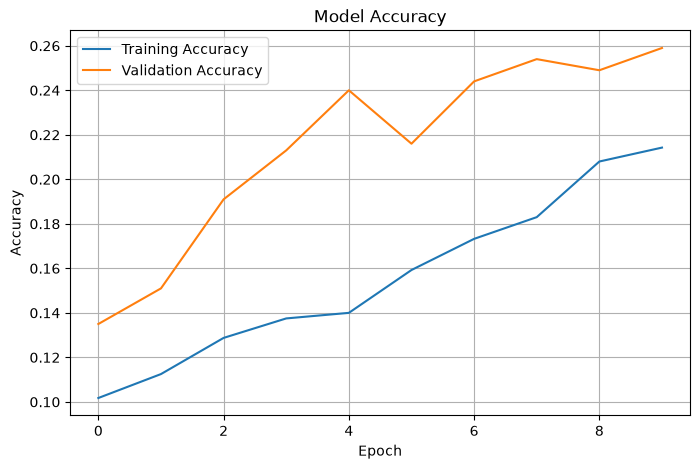

In [122]:
plt.figure(figsize=(8, 5))

plt.plot(
    history.history["accuracy"],
    label="Training Accuracy"
)

plt.plot(
    history.history["val_accuracy"],
    label="Validation Accuracy"
)

plt.title("Model Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.legend()
plt.grid()

plt.show()

графік accuracy показує, як змінюється прогнози на train і validation, якщо train accuracy зростає, а validation перестає покращуватися, це може бути ознакою оверліфтінгу

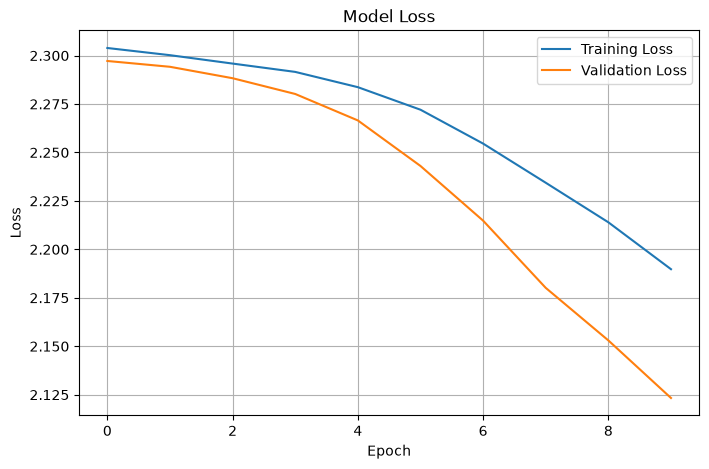

In [123]:
plt.figure(figsize=(8, 5))

plt.plot(
    history.history["loss"],
    label="Training Loss"
)

plt.plot(
    history.history["val_loss"],
    label="Validation Loss"
)

plt.title("Model Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.legend()
plt.grid()

plt.show()

графік loss показує динаміку помилки під час навчання

In [124]:
val_loss, val_accuracy = model.evaluate(
    x_val,
    y_val,
    verbose=0
)

print(f"Validation Loss: {val_loss:.4f}")
print(f"Validation Accuracy: {val_accuracy:.4f}")
print(f"Validation Accuracy: {val_accuracy * 100:.2f}%")

Validation Loss: 2.1233
Validation Accuracy: 0.2590
Validation Accuracy: 25.90%


`model.evaluate()` обчислює loss та accuracy на валідаційній вибірці й дає загальну оцінку якості моделі на даних, які не використовувались для оновлення ваг

In [125]:
prediction_probabilities = model.predict(
    x_val,
    verbose=1
)

print(
    "Prediction array shape:",
    prediction_probabilities.shape
)

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
Prediction array shape: (1000, 10)


In [128]:
test_images = [
    path
    for path in TEST_DIR.rglob("*")
    if path.suffix.lower()
    in IMAGE_EXTENSIONS
]

print(
    "Number of test images:",
    len(test_images)
)

print()

print("First test images:")

for path in test_images[:10]:
    print(path)

Number of test images: 990

First test images:
data\kaggle_simpson_testset\kaggle_simpson_testset\abraham_grampa_simpson_0.jpg
data\kaggle_simpson_testset\kaggle_simpson_testset\abraham_grampa_simpson_1.jpg
data\kaggle_simpson_testset\kaggle_simpson_testset\abraham_grampa_simpson_10.jpg
data\kaggle_simpson_testset\kaggle_simpson_testset\abraham_grampa_simpson_11.jpg
data\kaggle_simpson_testset\kaggle_simpson_testset\abraham_grampa_simpson_12.jpg
data\kaggle_simpson_testset\kaggle_simpson_testset\abraham_grampa_simpson_13.jpg
data\kaggle_simpson_testset\kaggle_simpson_testset\abraham_grampa_simpson_14.jpg
data\kaggle_simpson_testset\kaggle_simpson_testset\abraham_grampa_simpson_15.jpg
data\kaggle_simpson_testset\kaggle_simpson_testset\abraham_grampa_simpson_16.jpg
data\kaggle_simpson_testset\kaggle_simpson_testset\abraham_grampa_simpson_17.jpg


In [129]:
homer_test_images = [
    path
    for path in test_images
    if "homer_simpson"
    in path.name.lower()
]

print(
    "Homer test images:",
    len(homer_test_images)
)

print(
    homer_test_images[:5]
)

Homer test images: 50
[WindowsPath('data/kaggle_simpson_testset/kaggle_simpson_testset/homer_simpson_0.jpg'), WindowsPath('data/kaggle_simpson_testset/kaggle_simpson_testset/homer_simpson_1.jpg'), WindowsPath('data/kaggle_simpson_testset/kaggle_simpson_testset/homer_simpson_10.jpg'), WindowsPath('data/kaggle_simpson_testset/kaggle_simpson_testset/homer_simpson_11.jpg'), WindowsPath('data/kaggle_simpson_testset/kaggle_simpson_testset/homer_simpson_12.jpg')]


In [130]:
if len(homer_test_images) > 0:
    test_path = homer_test_images[0]
else:
    test_path = test_images[0]

print("Selected test image:")
print(test_path)

Selected test image:
data\kaggle_simpson_testset\kaggle_simpson_testset\homer_simpson_0.jpg


In [131]:
def prepare_image(image_path):

    image = cv.imread(
        str(image_path)
    )

    if image is None:
        raise ValueError(
            f"Could not read image: {image_path}"
        )

    image_rgb = cv.cvtColor(
        image,
        cv.COLOR_BGR2RGB
    )

    gray = cv.cvtColor(
        image,
        cv.COLOR_BGR2GRAY
    )

    resized = cv.resize(
        gray,
        IMG_SIZE,
        interpolation=cv.INTER_AREA
    )

    normalized = (
        resized.astype("float32")
        / 255.0
    )


    input_tensor = normalized[
        np.newaxis,
        ...,
        np.newaxis
    ]

    return image_rgb, input_tensor

`prepare_image()` приводить окреме тестове зображення до того самого формату, що й навчальні дані: grayscale, `80×80`, нормалізація та форма `(1,80,80,1)`

In [132]:
image_rgb, input_tensor = prepare_image(
    test_path
)

probabilities = model.predict(
    input_tensor,
    verbose=0
)[0]

predicted_index = np.argmax(
    probabilities
)

predicted_character = characters[
    predicted_index
]

confidence = probabilities[
    predicted_index
]


print(
    "Predicted character:",
    predicted_character
)

print(
    f"Confidence: "
    f"{confidence * 100:.2f}%"
)

Predicted character: marge_simpson
Confidence: 14.76%


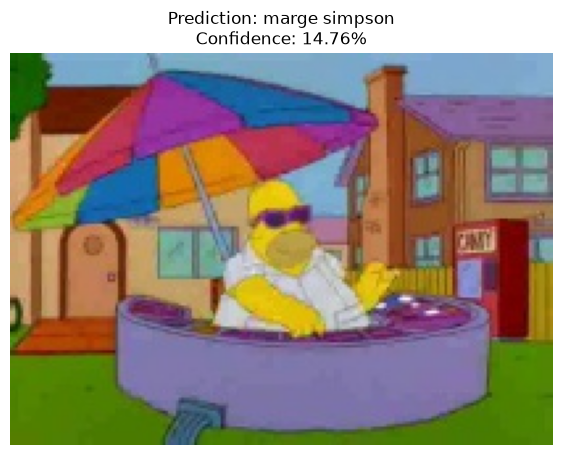

In [133]:
plt.figure(figsize=(7, 7))

plt.imshow(
    image_rgb
)

plt.title(
    f"Prediction: "
    f"{predicted_character.replace('_', ' ')}\n"
    f"Confidence: "
    f"{confidence * 100:.2f}%"
)

plt.axis("off")

plt.show()

In [135]:
MODEL_PATH = "simpsons_cnn.keras"

model.save(
    MODEL_PATH
)

print(
    "Model saved successfully:"
)

print(
    MODEL_PATH
)

Model saved successfully:
simpsons_cnn.keras


`model.save()` зберігає архітектуру і навчені ваги у файл `.keras`, щоб модель можна було завантажити пізніше без повторного навчання